In [ ]:
'''
Source: Źródło: https://www.kaggle.com/datasets/iabhishekofficial/mobile-price-classification.
'''

'\nSource: Źródło: https://www.kaggle.com/iabhishekoﬃcial/mobile-price-classification.\n'

In [2]:
# instalacja bibliotek w terminalu
# pip3 install pandas numpy matplotlib seaborn

In [3]:
# import funkcji do stworzenia raportu
from IPython.display import display, Markdown

# import podstawowych bibliotek
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline

In [4]:
# wczytanie pliku csv z danymi

df = pd.read_csv("./mobile-price-classification_train.csv")

In [5]:
# df.shape drukuje wymiary zbioru, tj. rows, columns
# w tym wypadku jest to 2000 rows (cases) oraz 21 columns (vars)
print(df.shape)
print('**********')
# wyświetlenie pierwszy pięciu obserwacji
print(df.head())
print('**********')
# wyświetlenie wszystkich kolumn
print(df.columns.tolist())
print('**********')
# wyświetlenie typów danych
print(df.dtypes)
print('**********')
# Info o kompletności danych
print(df.info())
print('**********')
# Sprawdzenie brakujących wartości
print(df.isnull().sum())
print('**********')

(2000, 21)
**********
   battery_power  blue  clock_speed  dual_sim  fc  four_g  int_memory  m_dep  \
0            842     0          2.2         0   1       0           7    0.6   
1           1021     1          0.5         1   0       1          53    0.7   
2            563     1          0.5         1   2       1          41    0.9   
3            615     1          2.5         0   0       0          10    0.8   
4           1821     1          1.2         0  13       1          44    0.6   

   mobile_wt  n_cores  ...  px_height  px_width   ram  sc_h  sc_w  talk_time  \
0        188        2  ...         20       756  2549     9     7         19   
1        136        3  ...        905      1988  2631    17     3          7   
2        145        5  ...       1263      1716  2603    11     2          9   
3        131        6  ...       1216      1786  2769    16     8         11   
4        141        2  ...       1208      1212  1411     8     2         15   

   three_g  touc

In [6]:
# Rozkład price_range
df['price_range'].value_counts().sort_index()

price_range
0    500
1    500
2    500
3    500
Name: count, dtype: int64

In [7]:
# Statystyki opisowe zmiennych
with pd.option_context('display.max_columns', 40):
    print(df.describe(include='all'))

       battery_power       blue  clock_speed     dual_sim           fc  \
count    2000.000000  2000.0000  2000.000000  2000.000000  2000.000000   
mean     1238.518500     0.4950     1.522250     0.509500     4.309500   
std       439.418206     0.5001     0.816004     0.500035     4.341444   
min       501.000000     0.0000     0.500000     0.000000     0.000000   
25%       851.750000     0.0000     0.700000     0.000000     1.000000   
50%      1226.000000     0.0000     1.500000     1.000000     3.000000   
75%      1615.250000     1.0000     2.200000     1.000000     7.000000   
max      1998.000000     1.0000     3.000000     1.000000    19.000000   

            four_g   int_memory        m_dep    mobile_wt      n_cores  \
count  2000.000000  2000.000000  2000.000000  2000.000000  2000.000000   
mean      0.521500    32.046500     0.501750   140.249000     4.520500   
std       0.499662    18.145715     0.288416    35.399655     2.287837   
min       0.000000     2.000000     0

In [8]:
# top & bottom 3 dla mean, std, min, max
desc = df.describe()
stats = ['mean', 'std', 'min', 'max']

for stat in stats:
    print(f"\n====== TOP 3 {stat.upper()} ======")
    # w poniższym po dodaniu .index otrzymam jedynie nazwę kolumny
    # teraz otrzymam nazwę + wartość
    print(desc.loc[stat].nlargest(3))

for stat in stats:
    print(f"\n====== BOTTOM 3 {stat.upper()} ======")
    print(desc.loc[stat].nsmallest(3))

# kwartyle służą do zrozumienia rozkładu danej zmiennej
# użycie ich do stworzenia rankingu nie ma większego sensu
'''
top3_25p_cols = desc.loc['25%'].nlargest(3).index
print('Top 3 25%:')
print(top3_25p_cols)

top3_25p_cols = desc.loc['25%'].nsmallest(3).index
print('Bottom 3 25%:')
print(top3_25p_cols)

top3_50p_cols = desc.loc['50%'].nlargest(3).index
print('Top 3 50%:')
print(top3_50p_cols)

top3_50p_cols = desc.loc['50%'].nsmallest(3).index
print('Bottom 3 50%:')
print(top3_50p_cols)

top3_75p_cols = desc.loc['75%'].nlargest(3).index
print('Top 3 75%:')
print(top3_75p_cols)

top3_75p_cols = desc.loc['75%'].nsmallest(3).index
print('Bottom 3 75%:')
print(top3_75p_cols)
'''


====== TOP 3 MEAN ======
ram              2124.2130
px_width         1251.5155
battery_power    1238.5185
Name: mean, dtype: float64

====== TOP 3 STD ======
ram              1084.732044
px_height         443.780811
battery_power     439.418206
Name: std, dtype: float64

====== TOP 3 MIN ======
battery_power    501.0
px_width         500.0
ram              256.0
Name: min, dtype: float64

====== TOP 3 MAX ======
ram              3998.0
battery_power    1998.0
px_width         1998.0
Name: max, dtype: float64

====== BOTTOM 3 MEAN ======
blue            0.49500
m_dep           0.50175
touch_screen    0.50300
Name: mean, dtype: float64

====== BOTTOM 3 STD ======
m_dep      0.288416
three_g    0.426273
four_g     0.499662
Name: std, dtype: float64

====== BOTTOM 3 MIN ======
blue        0.0
dual_sim    0.0
fc          0.0
Name: min, dtype: float64

====== BOTTOM 3 MAX ======
blue        1.0
dual_sim    1.0
four_g      1.0
Name: max, dtype: float64


"\ntop3_25p_cols = desc.loc['25%'].nlargest(3).index\nprint('Top 3 25%:')\nprint(top3_25p_cols)\n\ntop3_25p_cols = desc.loc['25%'].nsmallest(3).index\nprint('Bottom 3 25%:')\nprint(top3_25p_cols)\n\ntop3_50p_cols = desc.loc['50%'].nlargest(3).index\nprint('Top 3 50%:')\nprint(top3_50p_cols)\n\ntop3_50p_cols = desc.loc['50%'].nsmallest(3).index\nprint('Bottom 3 50%:')\nprint(top3_50p_cols)\n\ntop3_75p_cols = desc.loc['75%'].nlargest(3).index\nprint('Top 3 75%:')\nprint(top3_75p_cols)\n\ntop3_75p_cols = desc.loc['75%'].nsmallest(3).index\nprint('Bottom 3 75%:')\nprint(top3_75p_cols)\n"

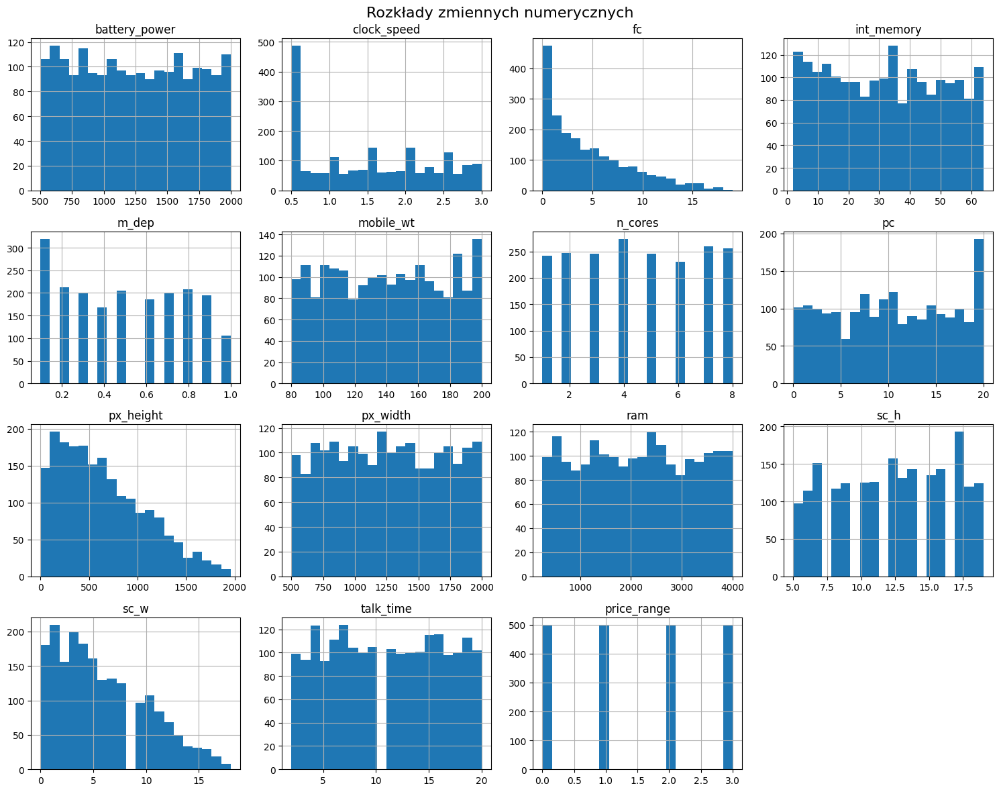

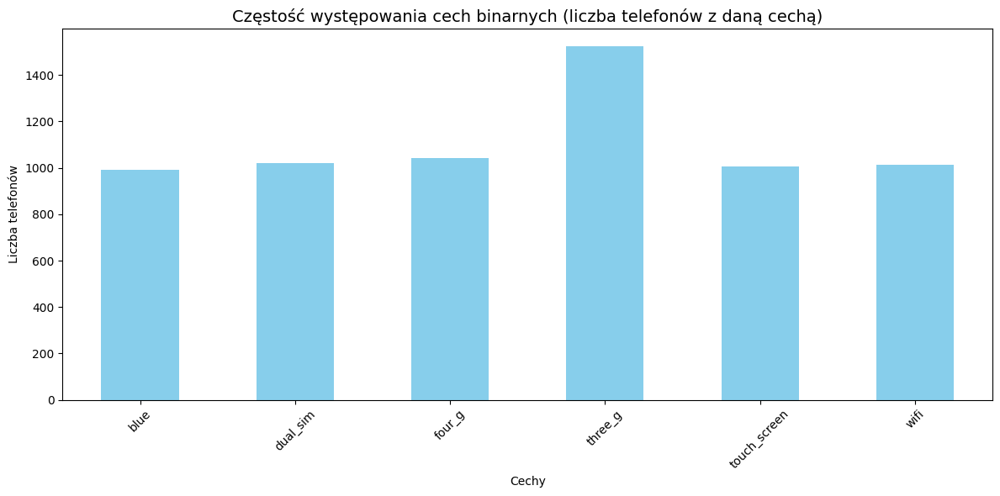

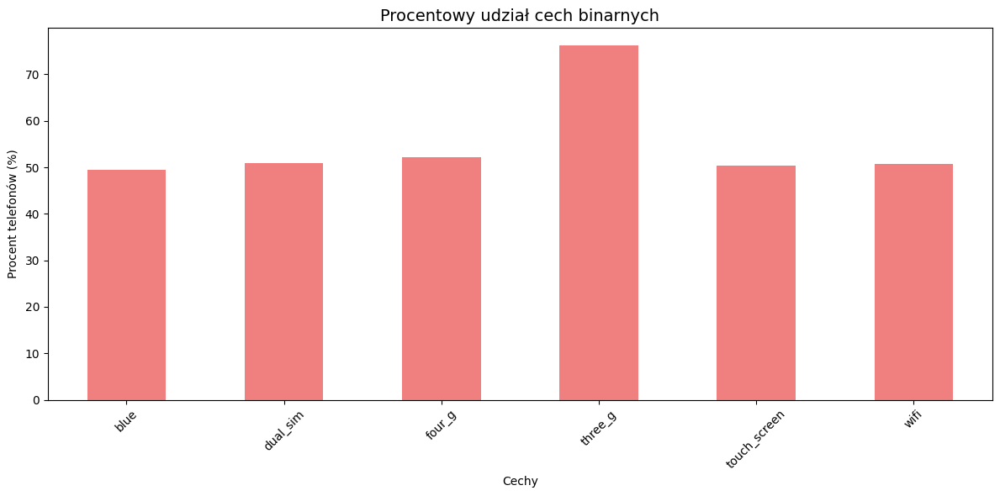

In [9]:
# Wykresy dla zmiennych.
# Przed stworzeniem histogramów należy podzielić zmienne wg typów,
# tj. wyodrębnić zmienne numeryczne, a z nich binarne.
# Typ wykresu będzie zależał od rodzaju zmiennej.

# Rozdzielenie zmiennych numerycznych od binarnych

numeric_vars = []
binary_vars = []

for col in df.select_dtypes(include =['int64', 'float64']).columns:
    unique_values = set(df[col].unique())

    # binarna: 0 i 1 (lub ich podzbiór)
    if unique_values.issubset({0, 1}):
        binary_vars.append(col)
    else:
        numeric_vars.append(col)

# Histogramy - zmienne numeryczne

if numeric_vars:    # czy lista jest pusta?
    df[numeric_vars].hist(bins=20, figsize=(15,12))
    plt.suptitle('Rozkłady zmiennych numerycznych', fontsize=16)
    plt.tight_layout()
    plt.show()

# Bar plot - zmienne binarne

if binary_vars:                                # czy lista jest pusta?
    binary_counts = df[binary_vars].sum()      # zlicza wystąpienia (1 = cecha)

    plt.figure(figsize=(12,6))
    binary_counts.plot(kind='bar', color='skyblue')
    plt.title('Częstość występowania cech binarnych (liczba telefonów z ' \
    'daną cechą)', fontsize=14)
    plt.xlabel('Cechy')
    plt.ylabel('Liczba telefonów')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(12,6))
    binary_percentages = (df[binary_vars].sum() / len(df)) * 100
    binary_percentages.plot(kind='bar', color='lightcoral')
    plt.title('Procentowy udział cech binarnych', fontsize=14)
    plt.xlabel('Cechy')
    plt.ylabel('Procent telefonów (%)')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

Korelacja z price_range:
price_range      1.000000
ram              0.917046
battery_power    0.200723
px_width         0.165818
px_height        0.148858
int_memory       0.044435
sc_w             0.038711
pc               0.033599
three_g          0.023611
sc_h             0.022986
fc               0.021998
talk_time        0.021859
blue             0.020573
wifi             0.018785
dual_sim         0.017444
four_g           0.014772
n_cores          0.004399
m_dep            0.000853
clock_speed     -0.006606
mobile_wt       -0.030302
touch_screen    -0.030411
Name: price_range, dtype: float64


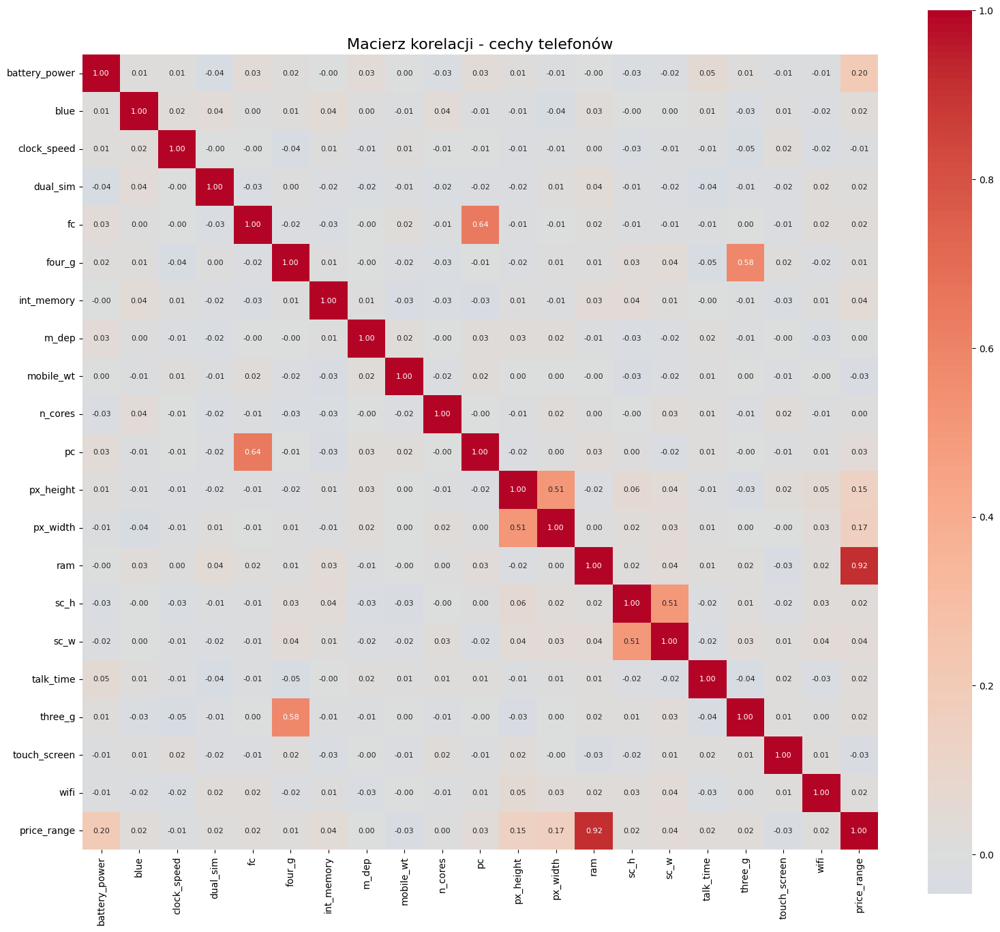

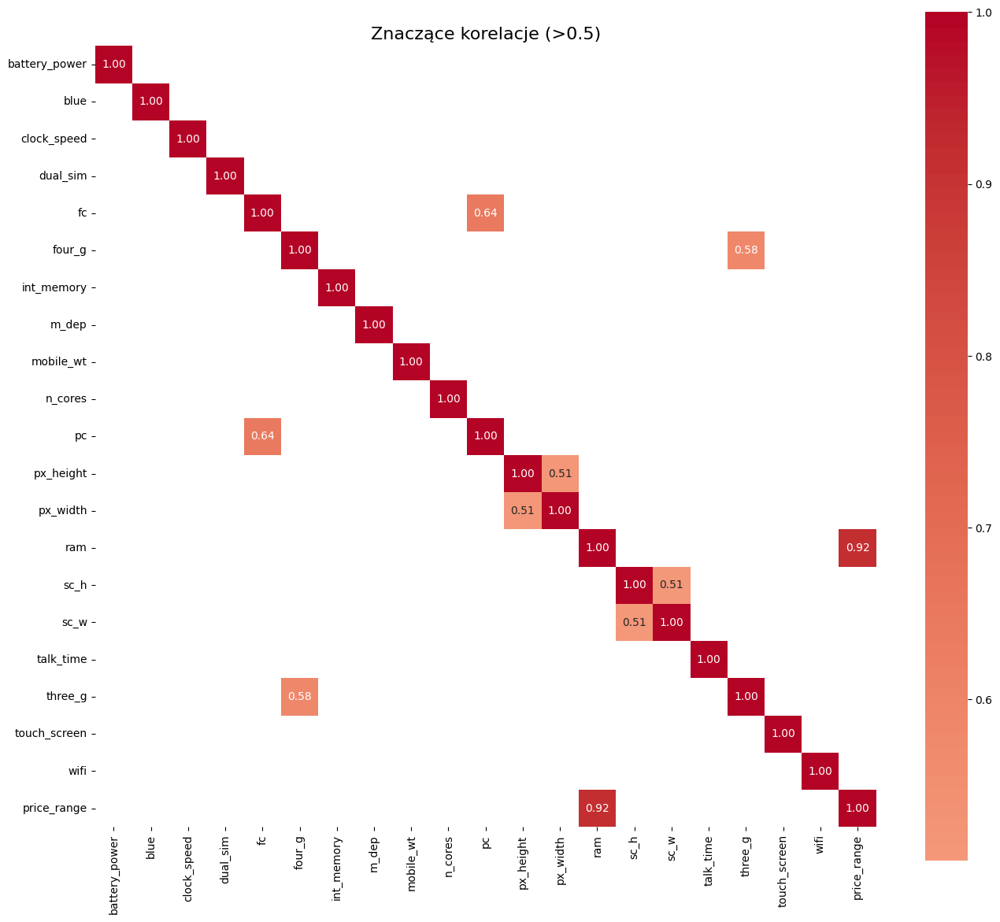

In [10]:
# Macierz korelacji dla każdej zmiennej
# Sortowanie korelacji wg ceny

price_corr = df.corr()['price_range'].sort_values(ascending=False)
print ("Korelacja z price_range:")
print(price_corr)

# Macierz korelacji
correlation_matrix = df.corr()
plt.figure(figsize=(16, 14))
sns.heatmap(correlation_matrix, 
            annot=True, 
            cmap='coolwarm', 
            center=0, # wyśrodkowanie na 0 kolor biały
            square=True, # kwadratowe komórki
            fmt='.2f', # dwa miejsca po przecinku
            annot_kws={"size": 8})
plt.title('Macierz korelacji - cechy telefonów', fontsize=16)
plt.tight_layout()
plt.show()

# Znacząca korelacja
# 0.0-0.3: słaba korelacja
# 0.3-0.7: umiarkowana korelacja
# 0.7-1.0: silna korelacja
# Wszystko zależy od kontekstu.

mask = np.abs(correlation_matrix) < 0.5
plt.figure(figsize=(16,14))
sns.heatmap(correlation_matrix,
            annot=True,
            mask=mask,
            cmap='coolwarm',
            center=0,
            square=True,
            fmt='.2f')
plt.title('Znaczące korelacje (>0.5)', fontsize=16)
plt.show()

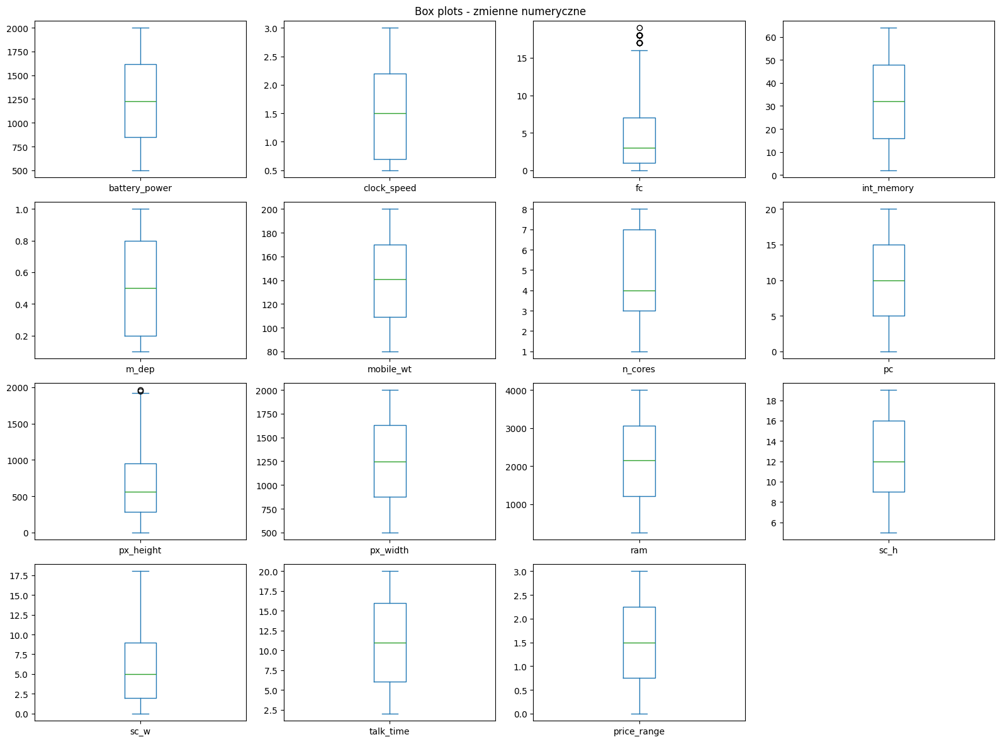

In [11]:
# Wykresy pudełkowe dla zmiennych numerycznych

if numeric_vars:
    df[numeric_vars].plot(kind='box',
                          subplots=True,
                          layout=(4,4),
                          figsize=(16,12),
                          sharex=False,
                          sharey=False)
    plt.suptitle('Box plots - zmienne numeryczne')
    plt.tight_layout()
    plt.show()

Outliers w zmiennych numerycznych:
battery_power     0
clock_speed       0
fc               18
int_memory        0
m_dep             0
mobile_wt         0
n_cores           0
pc                0
px_height         2
px_width          0
ram               0
sc_h              0
sc_w              0
talk_time         0
price_range       0
dtype: int64
Średnie wartości zmiennych:
ram              2124.21300
px_width         1251.51550
battery_power    1238.51850
px_height         645.10800
mobile_wt         140.24900
int_memory         32.04650
sc_h               12.30650
talk_time          11.01100
pc                  9.91650
sc_w                5.76700
n_cores             4.52050
fc                  4.30950
clock_speed         1.52225
price_range         1.50000
m_dep               0.50175
dtype: float64

Mediana średnich: 11.01

Zmienne HIGH VALUE (średnia > 11.01):
['battery_power', 'int_memory', 'mobile_wt', 'px_height', 'px_width', 'ram', 'sc_h']

Zmienne LOW VALUE (średnia <= 11.01):
[

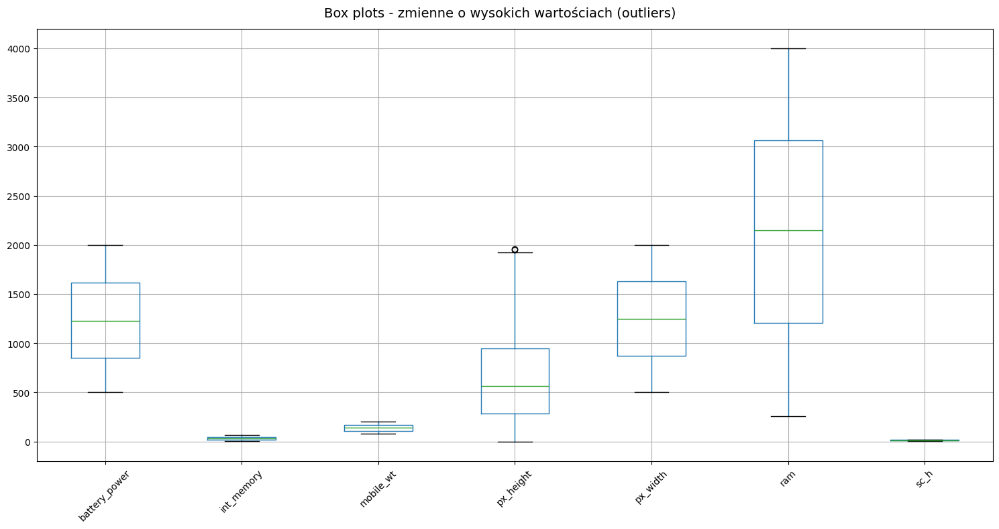

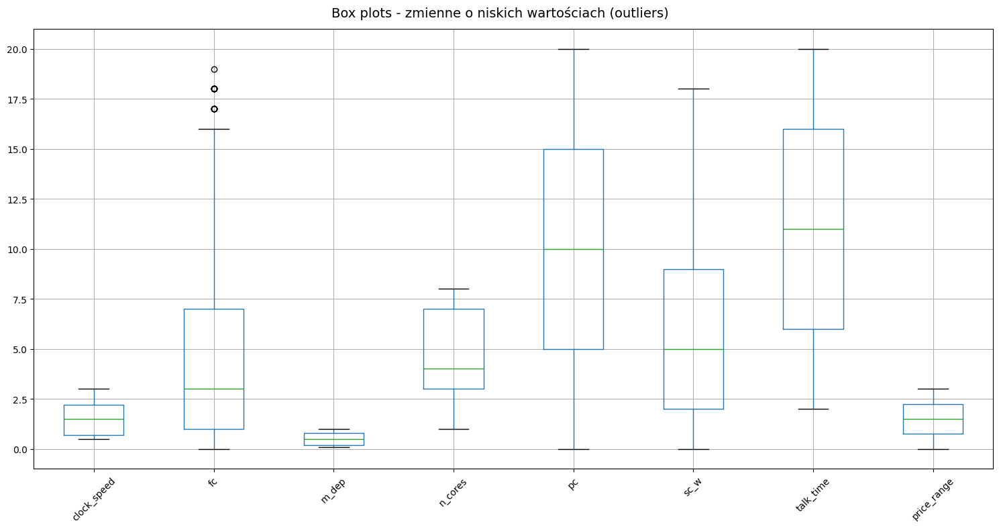

Ranking zmiennych z outlierami:
fc           18
px_height     2
dtype: int64

Szczegółowy ranking z procentami:
fc: 18 outlierów (0.9%)
px_height: 2 outlierów (0.1%)


In [12]:
"""
PORÓWNANIE METOD WYKRYWANIA OUTLIERÓW:

1. METODA 3-SIGMA (konserwatywna):
   - Outlier: wartość > mean ± 3*standard_deviation
   - Wykrywa: ~0.3% populacji (bardzo ekstremalne przypadki)
   - Zastosowanie: wykrywanie błędów danych, kontrola jakości
   - Przykład: telefon z baterią 50,000 mAh (prawdopodobny błąd)

2. METODA BOX PLOT / IQR (praktyczna):
   - Outlier: wartość poza Q1-1.5*IQR lub Q3+1.5*IQR  
   - Wykrywa: ~7% populacji (nietypowe ale realne przypadki)
   - Zastosowanie: analiza biznesowa, segmentacja produktów
   - Przykład: telefon z 16GB RAM (premium, ale realny)
"""

# Zmienne odstające (bez zmiennych binarnych)
# Identyfikacja wartości odstających za pomocą wykresów pudełkowych
# 3-sigma
# outliers_numeric = df[numeric_vars].apply(lambda x: np.abs(x - x.mean()) > 3 * x.std())
# Krótka wersja
outliers_numeric = df[numeric_vars].apply(lambda x: (x < x.quantile(0.25) - 1.5*(x.quantile(0.75) - x.quantile(0.25))) | 
                                                    (x > x.quantile(0.75) + 1.5*(x.quantile(0.75) - x.quantile(0.25))))
print("Outliers w zmiennych numerycznych:")
print(outliers_numeric.sum())

# Osobne wykresy zaoferują lepszą czytelność
# Oblicz średnie dla każdej zmiennej numerycznej
means = df[numeric_vars].mean()
print("Średnie wartości zmiennych:")
print(means.sort_values(ascending=False))

# Automatyczny podział na podstawie mediany średnich
median_of_means = means.median()
print(f"\nMediana średnich: {median_of_means:.2f}")

# Podział automatyczny
high_value_vars = means[means > median_of_means].index.tolist()
low_value_vars = means[means <= median_of_means].index.tolist()

print(f"\nZmienne HIGH VALUE (średnia > {median_of_means:.2f}):")
print(high_value_vars)
print(f"\nZmienne LOW VALUE (średnia <= {median_of_means:.2f}):")
print(low_value_vars)

# Wykresy dla grupy 'HIGH VALUE'
if high_value_vars:
    plt.figure(figsize=(15, 8))
    df[high_value_vars].boxplot(figsize=(15, 8), rot=45)
    plt.suptitle('Box plots - zmienne o wysokich wartościach (outliers)', fontsize=14)
    plt.tight_layout()
    plt.show()

# Wykresy dla grupy 'LOW VALUE'
if low_value_vars:
    plt.figure(figsize=(15, 8))
    df[low_value_vars].boxplot(figsize=(15, 8), rot=45)
    plt.suptitle('Box plots - zmienne o niskich wartościach (outliers)', fontsize=14)
    plt.tight_layout()
    plt.show()

# Zmienne z największą liczbą outlierów (tylko te które mają outliers)
outlier_count = outliers_numeric.sum().sort_values(ascending=False)
outlier_count_filtered = outlier_count[outlier_count > 0]
print("Ranking zmiennych z outlierami:")
print(outlier_count_filtered)

# Szczegółowy ranking z procentami
print("\nSzczegółowy ranking z procentami:")
for var, count in outlier_count_filtered.items():  # ✅ Użyj filtered
    pct = (count / len(df)) * 100  # ✅ Oblicz procent tutaj
    print(f"{var}: {count} outlierów ({pct:.1f}%)")

In [13]:
# Wykorzystaj moduł Pandas, aby rozpoznać zależności pomiędzy zmienną objaśnianą i objaśnianymi (spróbuj policzyć statystyki w podgrupach i tabele przestawne).

In [14]:
all_features = [col for col in df.columns if col != 'price_range']
print('Znalezione zmienne:')
print(all_features)

print("=== ŚREDNIE W PRZEDZIAŁACH CENOWYCH ===")
pivot_mean = pd.pivot_table(df, values=all_features, index='price_range', aggfunc='mean')
print(pivot_mean.round(2))

print("\n=== ZMIENNOŚĆ W PRZEDZIAŁACH CENOWYCH ===")
pivot_std = pd.pivot_table(df, values=all_features, index='price_range', aggfunc='std')
print(pivot_std.round(2))

print("\n=== TOP RÓŻNICUJĄCE CECHY (premium vs budget) ===")
# Różnica między najdroższym (3) a najtańszym (0) segmentem
price_gap = pivot_mean.loc[3] - pivot_mean.loc[0]
price_gap_sorted = price_gap.sort_values(ascending=False)
print("Największe różnice Premium vs Budget:")
print(price_gap_sorted.head(10).round(2))

print("\nNajmniejsze różnice (cechy nieistotne dla ceny):")
print(price_gap_sorted.tail(5).round(2))

"""
WARTOŚĆ KWARTYLI:

POZYCJONOWANIE PRODUKTU:
   - Q1/Q3 pokazują gdzie umieścić telefon w segmencie
   - "Żeby być w top 25% budget, potrzebuję >Q3(budget) RAM"

ANALIZA KONKURENCJI:
   - Czy segmenty się nakładają? (Q3 budget vs Q1 premium)
   - Gdzie są "luki" w ofercie?

   BENCHMARKING:
   - Mediana = typowy telefon w segmencie
   - Q1/Q3 = granice "dobrego" telefonu w kategorii

OGRANICZENIA:
- Więcej danych niż średnie (może przytłoczyć)
- Wymaga dokładnej interpretacji
- Średnie + różnice często wystarczą dla pierwszej analizy
"""

print("\n=== KWARTYLE W PRZEDZIAŁACH CENOWYCH (detale rozkładów) ===")
print("Q1 (25% percentyl):")
pivot_q1 = pd.pivot_table(df, values=all_features, index='price_range', 
                         aggfunc=lambda x: np.quantile(x, 0.25))
print(pivot_q1.round(2))

print("\nQ2 (mediana, 50% percentyl):")
pivot_q2 = pd.pivot_table(df, values=all_features, index='price_range', 
                         aggfunc=lambda x: np.quantile(x, 0.5))
print(pivot_q2.round(2))

print("\nQ3 (75% percentyl):")
pivot_q3 = pd.pivot_table(df, values=all_features, index='price_range', 
                         aggfunc=lambda x: np.quantile(x, 0.75))
print(pivot_q3.round(2))

Znalezione zmienne:
['battery_power', 'blue', 'clock_speed', 'dual_sim', 'fc', 'four_g', 'int_memory', 'm_dep', 'mobile_wt', 'n_cores', 'pc', 'px_height', 'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time', 'three_g', 'touch_screen', 'wifi']
=== ŚREDNIE W PRZEDZIAŁACH CENOWYCH ===
             battery_power  blue  clock_speed  dual_sim    fc  four_g  \
price_range                                                             
0                  1116.90  0.49         1.55      0.50  4.08    0.52   
1                  1228.87  0.49         1.49      0.51  4.34    0.52   
2                  1228.32  0.49         1.53      0.50  4.50    0.49   
3                  1379.98  0.52         1.52      0.53  4.32    0.55   

             int_memory  m_dep  mobile_wt  n_cores     pc  px_height  \
price_range                                                            
0                 31.17   0.49     140.55     4.60   9.57     536.41   
1                 32.12   0.52     140.51     4.30   9.92     666.8

====== Najsilniej skorelowane pary zmiennych ======
ram <---> price_range: 0.917
fc <---> pc: 0.645
four_g <---> three_g: 0.584
px_height <---> px_width: 0.511
sc_h <---> sc_w: 0.506
====== Wizualizacja top {min(5,len(correlated_pairs))} par ======


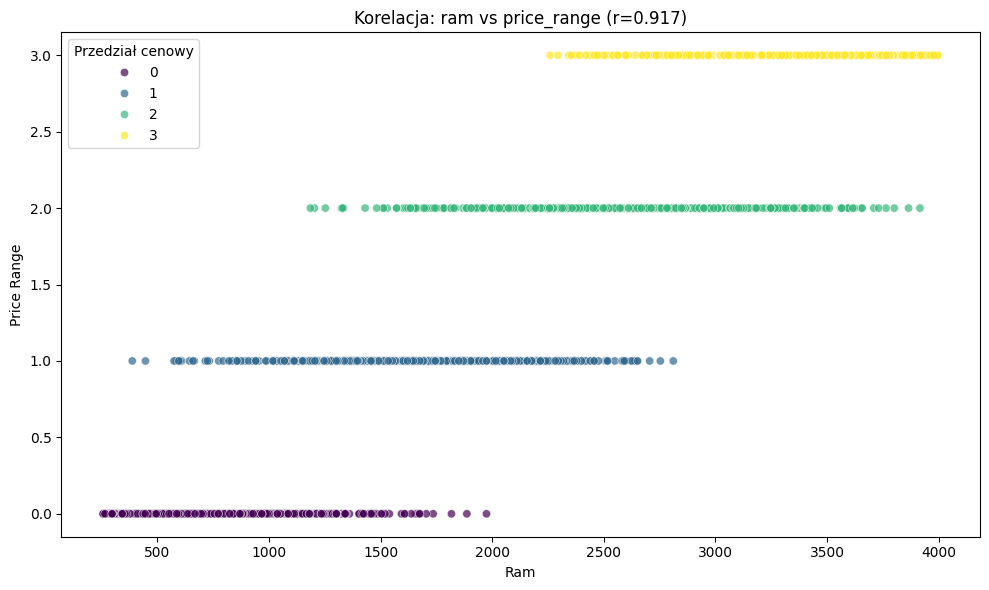

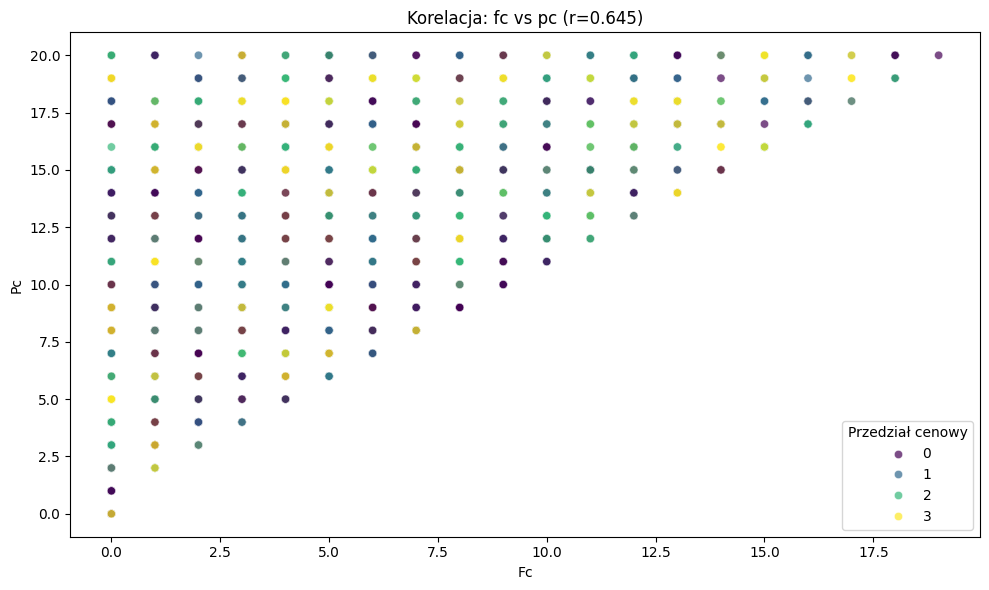

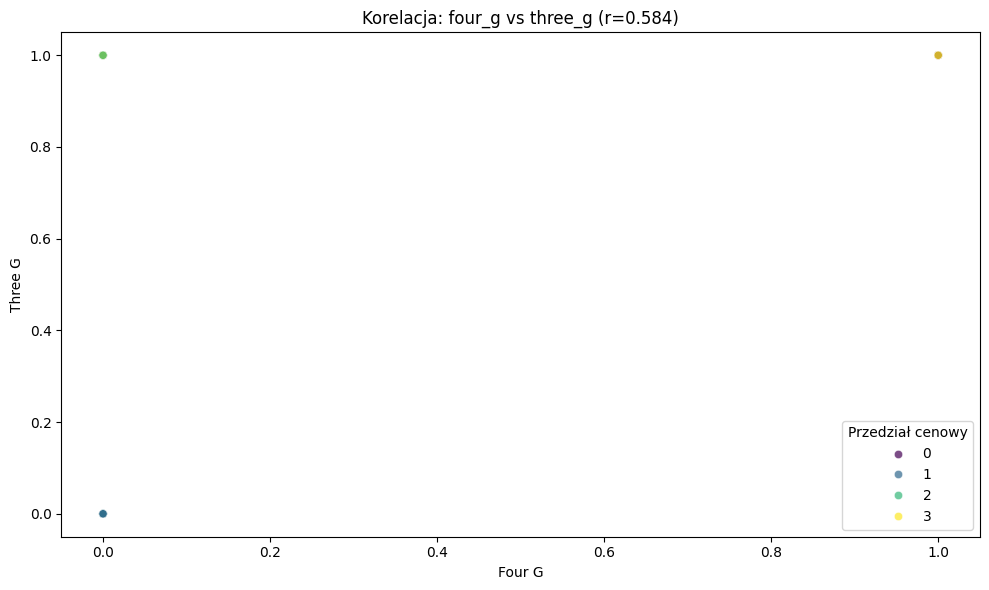

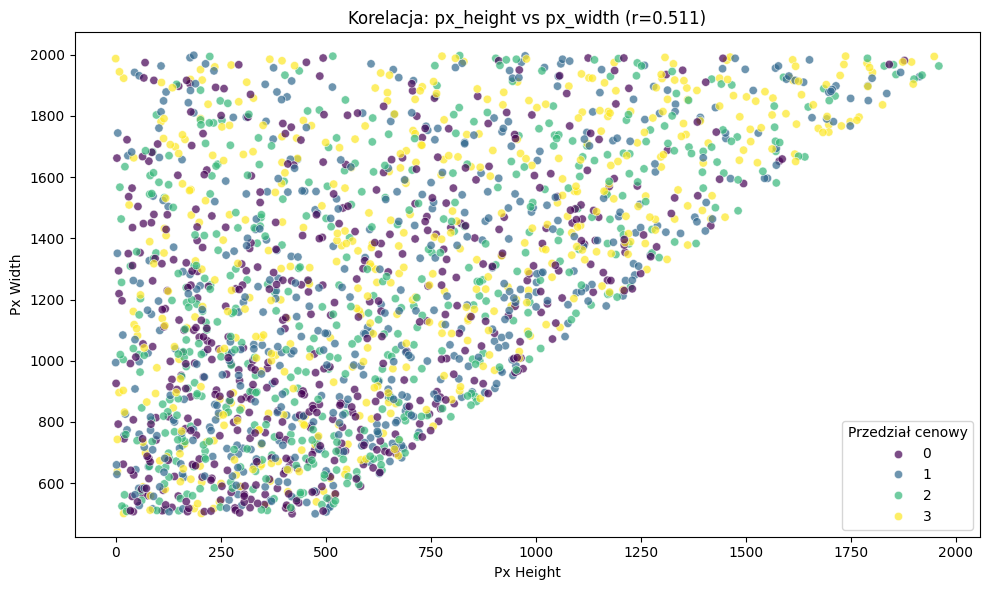

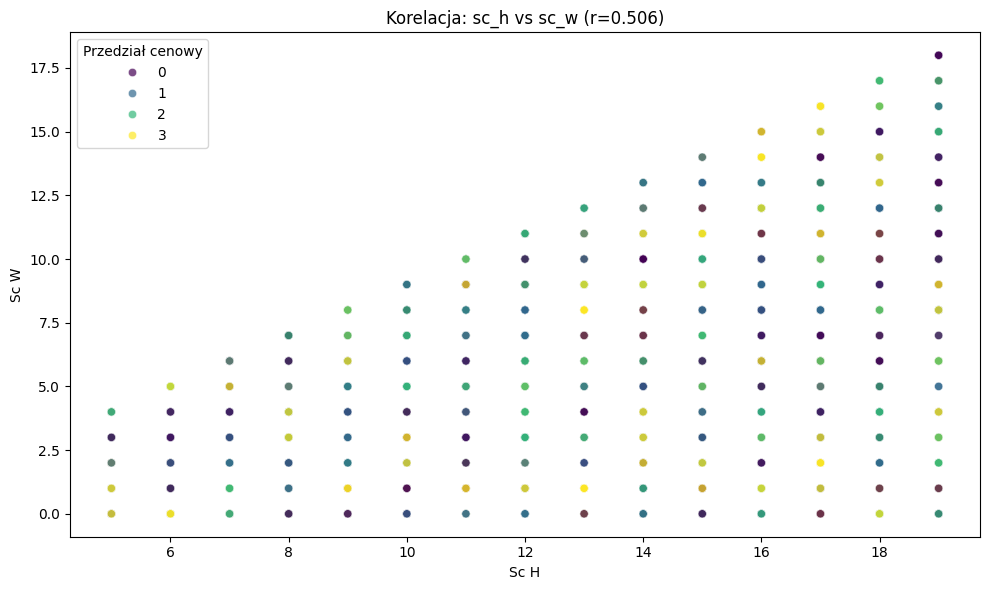

====== Korelacja z price_range ======
Zmienne silnie skorelowane z ceną:
ram: 0.917


In [15]:
def find_correlated_pairs(df, threshold=0.5):
    corr_matrix = df.corr()
    correlated_pairs = []
    for i in range(len(corr_matrix.columns)):
        for j in range(i+1, len(corr_matrix.columns)):
            corr_value = abs(corr_matrix.iloc[i,j])

            if threshold < corr_value < 1.0:
                var1 = corr_matrix.columns[i]
                var2 = corr_matrix.columns[j]
                correlated_pairs.append((var1, var2, corr_matrix.iloc[i,j]))

    # sortowanie wg siły korelacji
    correlated_pairs.sort(key=lambda x: abs(x[2]), reverse=True)

    return correlated_pairs

# znajduje skolrowane pary
correlated_pairs = find_correlated_pairs(df, threshold=0.5)

print("====== Najsilniej skorelowane pary zmiennych ======")
for var1, var2, corr in correlated_pairs:
    print(f"{var1} <---> {var2}: {corr:.3f}")

# wizualizacja top 5 skorelowanych par
print("====== Wizualizacja top {min(5,len(correlated_pairs))} par ======")
for i, (var1, var2, corr) in enumerate(correlated_pairs[:5]):
    plt.figure(figsize=(10,6))

    sns.scatterplot(x=var1, 
                    y=var2, 
                    hue='price_range', 
                    palette='viridis', 
                    data=df, 
                    alpha=0.7)
    
    plt.title(f'Korelacja: {var1} vs {var2} (r={corr:.3f})')
    plt.xlabel(var1.replace('_', ' ').title())
    plt.ylabel(var2.replace('_', ' ').title())
    plt.legend(title='Przedział cenowy')
    plt.tight_layout()
    plt.show()

# korelacja z price_range
print("====== Korelacja z price_range ======")
price_correlations = df.corr()['price_range'].sort_values(ascending=False)
strong_price_corr = price_correlations[abs(price_correlations) > 0.3]

print("Zmienne silnie skorelowane z ceną:")
for var,corr in strong_price_corr.items():
    # wykluczenie autokorelacji
    if var != 'price_range':
        print(f"{var}: {corr:.3f}")

=== ZMIENNE SILNIE SKORELOWANE Z CENĄ (>0.5) ===
ram: 0.917


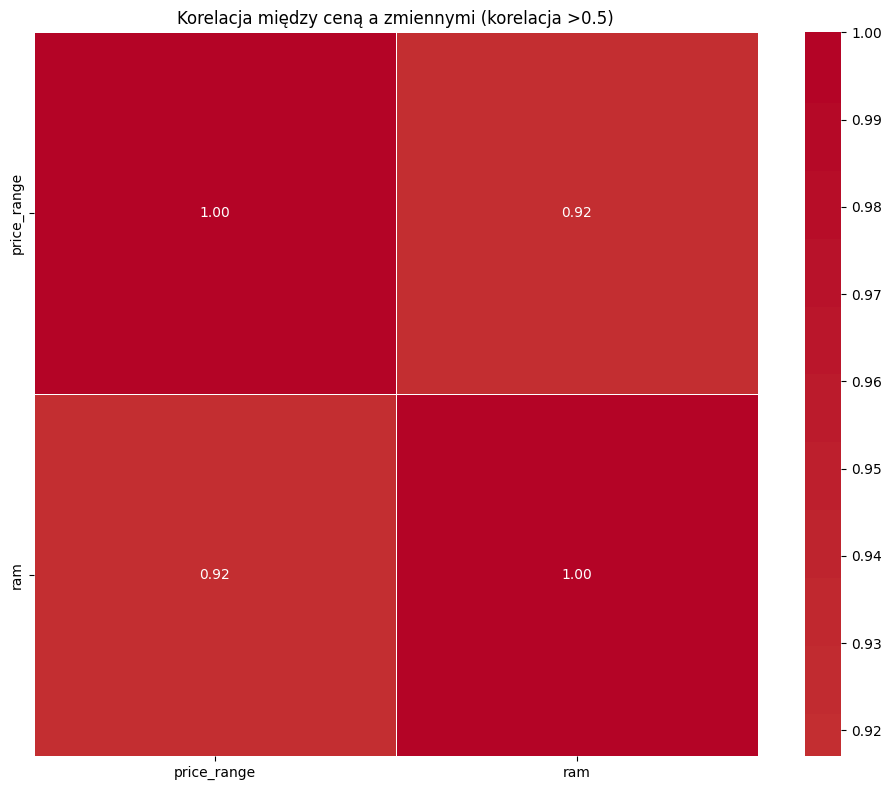

=== MACIERZ KORELACJI ===
             price_range    ram
price_range        1.000  0.917
ram                0.917  1.000

=== STATYSTYKI OPISOWE PER PRZEDZIAŁ CENOWY ===
Analizowane zmienne: ['ram']
               ram                                                           
             count     mean     std     min      25%     50%      75%     max
price_range                                                                  
0            500.0   785.31  362.76   256.0   488.75   719.5  1037.00  1974.0
1            500.0  1679.49  465.85   387.0  1354.00  1686.5  2033.75  2811.0
2            500.0  2582.82  496.21  1185.0  2292.75  2577.0  2927.00  3916.0
3            500.0  3449.23  393.02  2259.0  3207.50  3509.5  3764.75  3998.0

=== RÓŻNICE PREMIUM (3) vs BUDGET (0) ===
Największe różnice (Premium - Budget):
ram: +2663.9 (+339.2%)


In [16]:
# Automatyczne znajdowanie zmiennych silnie skorelowanych z price_range
def find_strong_price_correlations(df, threshold=0.5):
    """
    Znajduje zmienne silnie skorelowane z price_range
    """
    # Oblicz korelacje wszystkich zmiennych z price_range
    price_correlations = df.corr()['price_range'].abs().sort_values(ascending=False)
    
    # Wybierz zmienne powyżej threshold (wykluczając price_range samo ze sobą)
    strong_vars = price_correlations[price_correlations > threshold].index.tolist()
    
    print(f"=== ZMIENNE SILNIE SKORELOWANE Z CENĄ (>{threshold}) ===")
    for var in strong_vars:
        if var != 'price_range':
            corr_value = df.corr()['price_range'][var]
            print(f"{var}: {corr_value:.3f}")
    
    return strong_vars

# Znajdź automatycznie silnie skorelowane zmienne
strong_vars = find_strong_price_correlations(df, threshold=0.5)

# Analiza korelacji dla automatycznie znalezionych zmiennych
correlation = df[strong_vars].corr()

# Heatmapa korelacji
plt.figure(figsize=(10, 8))
sns.heatmap(correlation, annot=True, cmap='coolwarm', fmt='.2f', 
            linewidths=0.5, center=0, square=True)
plt.title(f'Korelacja między ceną a zmiennymi (korelacja >0.5)')
plt.tight_layout()
plt.show()

print("=== MACIERZ KORELACJI ===")
print(correlation.round(3))

# Statystyki grupowe (bez price_range)
analysis_vars = [var for var in strong_vars if var != 'price_range']
print(f"\n=== STATYSTYKI OPISOWE PER PRZEDZIAŁ CENOWY ===")
print(f"Analizowane zmienne: {analysis_vars}")
grouped_stats = df.groupby('price_range')[analysis_vars].describe()
print(grouped_stats.round(2))

# Dodatkowa analiza - różnice między segmentami
print(f"\n=== RÓŻNICE PREMIUM (3) vs BUDGET (0) ===")
grouped_means = df.groupby('price_range')[analysis_vars].mean()
differences = grouped_means.loc[3] - grouped_means.loc[0]
differences_sorted = differences.sort_values(ascending=False)
print("Największe różnice (Premium - Budget):")
for var, diff in differences_sorted.items():
    pct_change = (diff / grouped_means.loc[0][var]) * 100 if grouped_means.loc[0][var] != 0 else 0
    print(f"{var}: +{diff:.1f} ({pct_change:+.1f}%)")

In [17]:
# Zwizualizuj rozkład zmiennej objaśnianej, rozkłady empiryczne zmiennych objaśniających używając pakietu matplotlib.

In [18]:
# Histogram
# Histogram pozwala zobaczyć, jak rozkładają się wartości zmiennej objaśnianej. Możesz również dodać linię gęstości, aby lepiej zobaczyć rozkład.

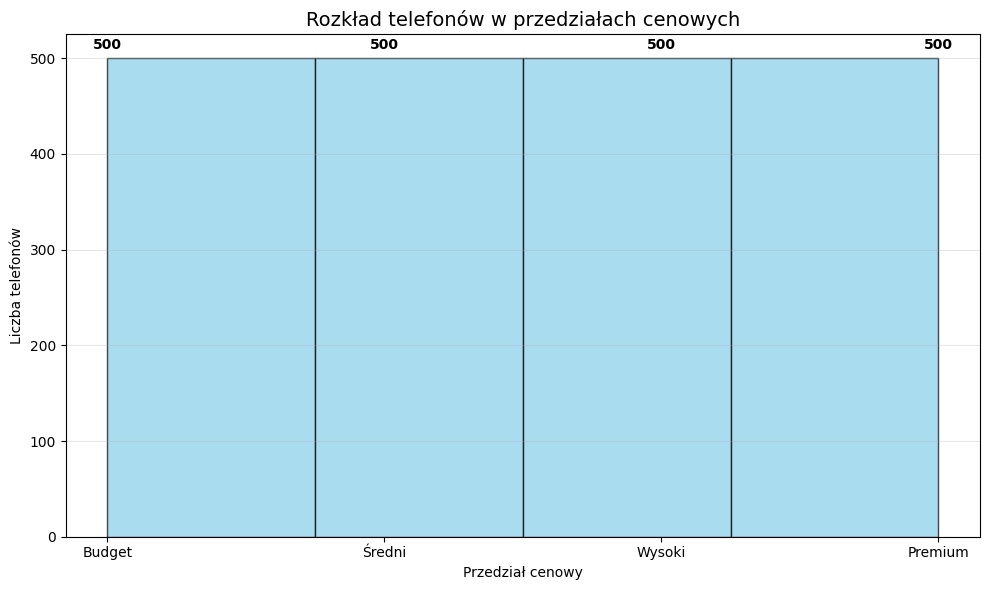

=== ROZKŁAD SEGMENTÓW CENOWYCH ===
Budget: 500 telefonów (25.0%)
Średni: 500 telefonów (25.0%)
Wysoki: 500 telefonów (25.0%)
Premium: 500 telefonów (25.0%)

=== ANALIZA ZRÓWNOWAŻENIA ===
Segmenty są zrównoważone
Stosunek największego do najmniejszego: 1.0

=== INSIGHT ===
Rynek jest równomiernie podzielony - każdy segment ma podobną wielkość
Najbardziej zatłoczony segment: Budget (500 telefonów)
Najmniej zatłoczony segment: Budget (500 telefonów)


In [19]:
# Rozkład zmiennej objaśnianej (price_range)
plt.figure(figsize=(10, 6))

# Oblicz statystyki
counts = df['price_range'].value_counts().sort_index()
percentages = (df['price_range'].value_counts(normalize=True) * 100).sort_index()
segments = ['Budget', 'Średni', 'Wysoki', 'Premium']

# Stwórz histogram
plt.hist(df['price_range'], bins=4, edgecolor='black', alpha=0.7, color='skyblue')
plt.title('Rozkład telefonów w przedziałach cenowych', fontsize=14)
plt.xlabel('Przedział cenowy')
plt.ylabel('Liczba telefonów')
plt.xticks(ticks=[0, 1, 2, 3], labels=segments)

# Dodaj liczby na słupkach
for i, count in enumerate(counts):
    plt.text(i, count + 10, str(count), ha='center', fontweight='bold')

plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

# Analiza rozkładu procentowego
print("=== ROZKŁAD SEGMENTÓW CENOWYCH ===")
for i, (segment, pct) in enumerate(zip(segments, percentages)):
    print(f"{segment}: {counts[i]} telefonów ({pct:.1f}%)")

# Sprawdź zrównoważenie segmentów
balance_ratio = counts.max() / counts.min() if counts.min() > 0 else float('inf')
print(f"\n=== ANALIZA ZRÓWNOWAŻENIA ===")
print(f"Segmenty {'są' if balance_ratio < 1.5 else 'NIE są'} zrównoważone")
print(f"Stosunek największego do najmniejszego: {balance_ratio:.1f}")

# Insight biznesowy
print(f"\n=== INSIGHT ===")
if balance_ratio < 1.2:
    print("Rynek jest równomiernie podzielony - każdy segment ma podobną wielkość")
elif balance_ratio < 2.0:
    print("Lekka nierównowaga - niektóre segmenty większe od innych")
else:
    print("Duża nierównowaga - znaczące różnice w wielkości segmentów")

most_crowded = segments[counts.idxmax()]
least_crowded = segments[counts.idxmin()]
print(f"Najbardziej zatłoczony segment: {most_crowded} ({counts.max()} telefonów)")
print(f"Najmniej zatłoczony segment: {least_crowded} ({counts.min()} telefonów)")

In [20]:
"""
DLACZEGO WYKRES GĘSTOŚCI NIE JEST IDEALNY DLA PRICE_RANGE:

1. ZMIENNA KATEGORYCZNA vs CIĄGŁA:
  - price_range to zmienna kategoryczna (0,1,2,3) - dyskretne kategorie
  - KDE (Kernel Density Estimation) zakłada zmienną ciągłą
  - Tworzy fałszywe wartości (np. 1.5, 2.7) które nie istnieją w rzeczywistości

2. MYLĄCE INTERPRETACJE:
  - Wykres sugeruje że telefon może mieć "cenę 1.5" 
  - W rzeczywistości są tylko 4 dyskretne kategorie
  - Wygładzenie między kategoriami wprowadza w błąd

3. LEPSZE ALTERNATYWY dla kategorii:
  - Bar plot - pokazuje prawdziwe częstości
  - Pie chart - pokazuje proporcje
  - Histogram - dyskretne słupki dla każdej kategorii

4. KDE ŚWIETNE dla zmiennych ciągłych:
  - RAM, battery_power, px_height - tam ma sens
  - Pokazuje rzeczywiste rozkłady prawdopodobieństwa

# Wykres gęstości dla zmiennej objaśnianej
plt.figure(figsize=(10, 6))
sns.kdeplot(df['price_range'], fill=True)
plt.title('Density Plot of Price Range')
plt.xlabel('Price Range')
plt.ylabel('Density')
plt.xticks(ticks=[0, 1, 2, 3], labels=['Low', 'Medium', 'High', 'Very high'])
plt.show()
"""

'\nDLACZEGO WYKRES GĘSTOŚCI NIE JEST IDEALNY DLA PRICE_RANGE:\n\n1. ZMIENNA KATEGORYCZNA vs CIĄGŁA:\n  - price_range to zmienna kategoryczna (0,1,2,3) - dyskretne kategorie\n  - KDE (Kernel Density Estimation) zakłada zmienną ciągłą\n  - Tworzy fałszywe wartości (np. 1.5, 2.7) które nie istnieją w rzeczywistości\n\n2. MYLĄCE INTERPRETACJE:\n  - Wykres sugeruje że telefon może mieć "cenę 1.5" \n  - W rzeczywistości są tylko 4 dyskretne kategorie\n  - Wygładzenie między kategoriami wprowadza w błąd\n\n3. LEPSZE ALTERNATYWY dla kategorii:\n  - Bar plot - pokazuje prawdziwe częstości\n  - Pie chart - pokazuje proporcje\n  - Histogram - dyskretne słupki dla każdej kategorii\n\n4. KDE ŚWIETNE dla zmiennych ciągłych:\n  - RAM, battery_power, px_height - tam ma sens\n  - Pokazuje rzeczywiste rozkłady prawdopodobieństwa\n\n# Wykres gęstości dla zmiennej objaśnianej\nplt.figure(figsize=(10, 6))\nsns.kdeplot(df[\'price_range\'], fill=True)\nplt.title(\'Density Plot of Price Range\')\nplt.xlabel(\

Automatycznie wybrane zmienne: ['ram', 'battery_power']


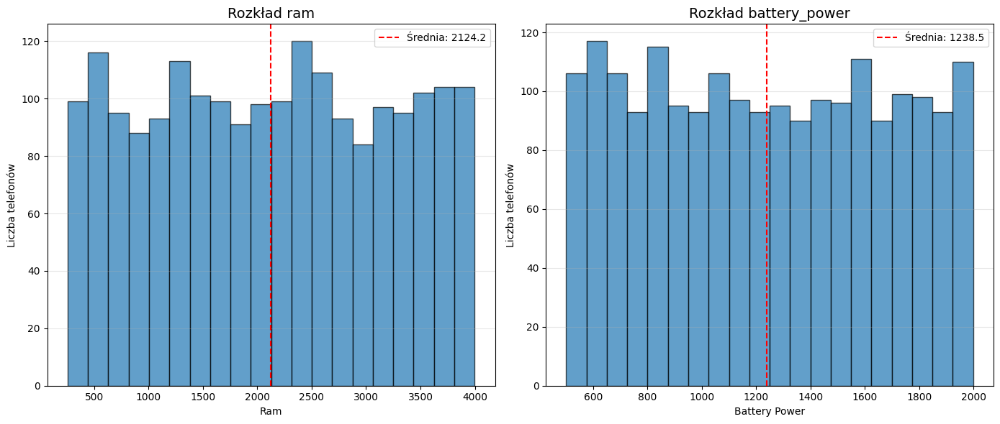

In [21]:
#Histogramy dla Zmiennych Objaśniających
#Histogramy pomagają zobaczyć rozkład poszczególnych zmiennych objaśniających.
# Automatycznie wybierz dwie najważniejsze zmienne (najsilniej skorelowane z ceną)
price_correlations = df.corr()['price_range'].abs().sort_values(ascending=False)
top_vars = price_correlations.drop('price_range').head(2).index.tolist()

print(f"Automatycznie wybrane zmienne: {top_vars}")

plt.figure(figsize=(14, 6))
for i, var in enumerate(top_vars):
    plt.subplot(1, 2, i+1)
    plt.hist(df[var], bins=20, edgecolor='black', alpha=0.7)
    plt.title(f'Rozkład {var}', fontsize=14)
    plt.xlabel(var.replace('_', ' ').title())
    plt.ylabel('Liczba telefonów')
    
    # Dodaj średnią
    mean_val = df[var].mean()
    plt.axvline(mean_val, color='red', linestyle='--', 
                label=f'Średnia: {mean_val:.1f}')
    plt.legend()
    plt.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()



=== AUTOMATYCZNIE WYBRANE ZMIENNE ===
1. ram: korelacja 0.917
2. battery_power: korelacja 0.201


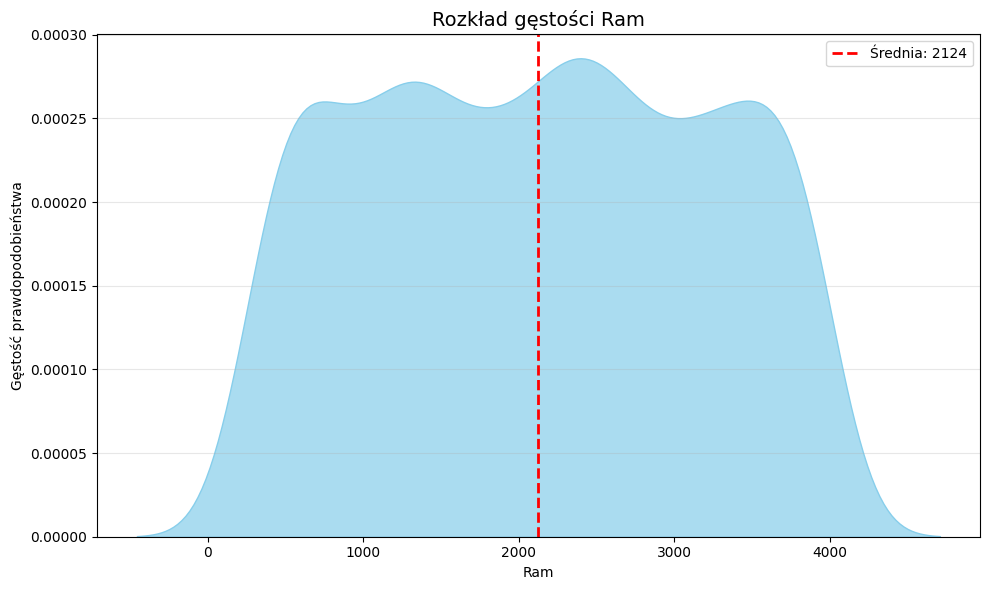

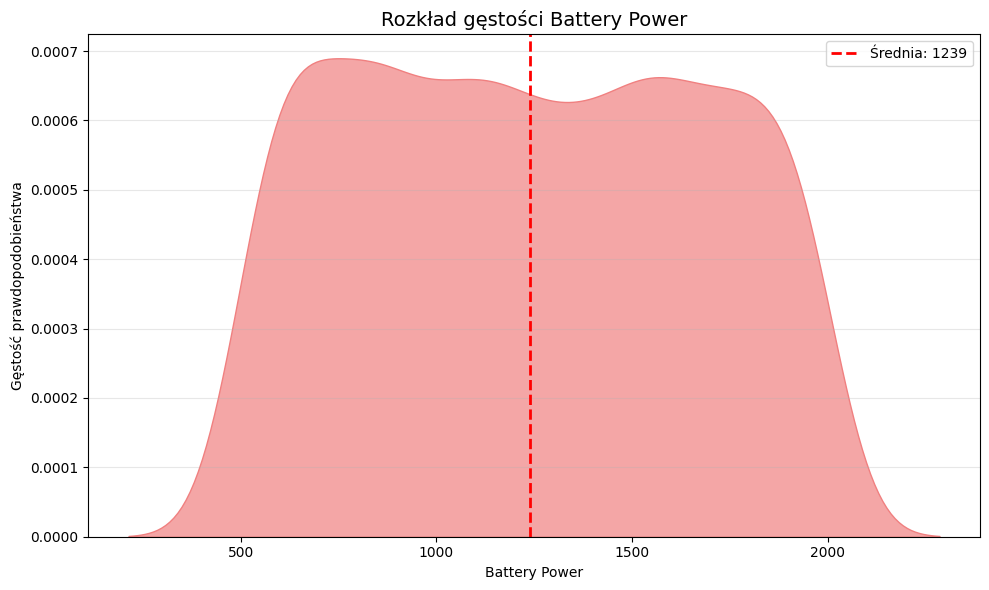

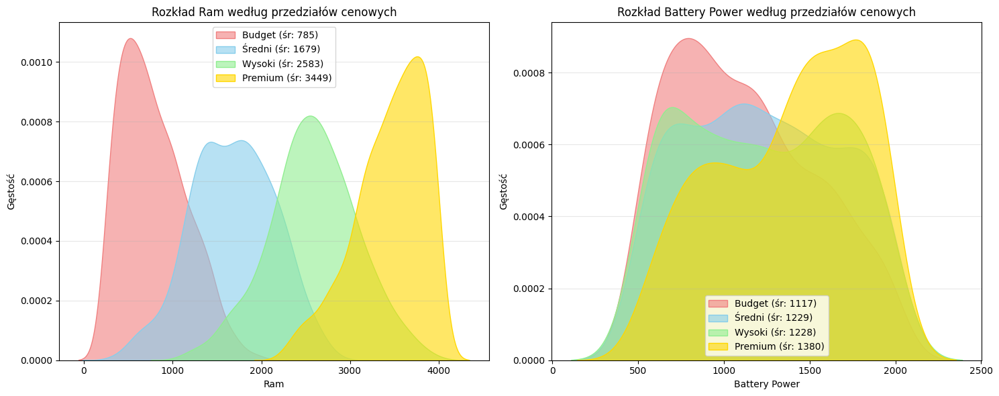


=== PORÓWNANIE TOP 2 PREDYKTORÓW CENY ===
ram:
  - Korelacja z ceną: 0.917
  - Średnia: 2124.2
  - Odchylenie std: 1084.7

battery_power:
  - Korelacja z ceną: 0.201
  - Średnia: 1238.5
  - Odchylenie std: 439.4


In [22]:
"""
DLACZEGO WYKRES GĘSTOŚCI NIE JEST IDEALNY DLA PRICE_RANGE:
- price_range to zmienna kategoryczna (0,1,2,3) - dyskretne kategorie
- KDE zakłada zmienną ciągłą i tworzy fałszywe wartości (1.5, 2.7)
- Lepsze: bar plot dla kategorii, KDE dla zmiennych ciągłych
"""

#Wykresy Gęstości (KDE) dla Zmiennych Objaśniających
#Wykresy gęstości dla zmiennych objaśniających mogą pomóc w ocenie ich rozkładów i identyfikacji ewentualnych nieliniowości.

# Automatycznie znajdź dwie najsilniej skorelowane z ceną zmienne
price_correlations = df.corr()['price_range'].abs().sort_values(ascending=False)
top_vars = price_correlations.drop('price_range').head(2).index.tolist()

print("=== AUTOMATYCZNIE WYBRANE ZMIENNE ===")
for i, var in enumerate(top_vars):
   corr_val = df.corr()['price_range'][var]
   print(f"{i+1}. {var}: korelacja {corr_val:.3f}")

# Wykres gęstości dla pierwszej najsilniej skorelowanej zmiennej
plt.figure(figsize=(10, 6))
var1 = top_vars[0]
sns.kdeplot(df[var1], fill=True, alpha=0.7, color='skyblue')
plt.title(f'Rozkład gęstości {var1.replace("_", " ").title()}', fontsize=14)
plt.xlabel(f'{var1.replace("_", " ").title()}')
plt.ylabel('Gęstość prawdopodobieństwa')
plt.grid(axis='y', alpha=0.3)

# Dodaj linię średniej dla kontekstu
mean_var1 = df[var1].mean()
plt.axvline(mean_var1, color='red', linestyle='--', linewidth=2, 
           label=f'Średnia: {mean_var1:.0f}')
plt.legend()
plt.tight_layout()
plt.show()

# Wykres gęstości dla drugiej najsilniej skorelowanej zmiennej
plt.figure(figsize=(10, 6))
var2 = top_vars[1]
sns.kdeplot(df[var2], fill=True, alpha=0.7, color='lightcoral')
plt.title(f'Rozkład gęstości {var2.replace("_", " ").title()}', fontsize=14)
plt.xlabel(f'{var2.replace("_", " ").title()}')
plt.ylabel('Gęstość prawdopodobieństwa')
plt.grid(axis='y', alpha=0.3)

# Dodaj linię średniej dla kontekstu
mean_var2 = df[var2].mean()
plt.axvline(mean_var2, color='red', linestyle='--', linewidth=2, 
           label=f'Średnia: {mean_var2:.0f}')
plt.legend()
plt.tight_layout()
plt.show()

# Porównanie obu zmiennych według przedziałów cenowych
plt.figure(figsize=(15, 6))
segments = ['Budget', 'Średni', 'Wysoki', 'Premium']
colors = ['lightcoral', 'skyblue', 'lightgreen', 'gold']

# Pierwsza zmienna
plt.subplot(1, 2, 1)
for i in range(4):
   segment_data = df[df['price_range'] == i][var1]
   sns.kdeplot(segment_data, fill=True, alpha=0.6, 
               label=f'{segments[i]} (śr: {segment_data.mean():.0f})',
               color=colors[i])

plt.title(f'Rozkład {var1.replace("_", " ").title()} według przedziałów cenowych', fontsize=12)
plt.xlabel(f'{var1.replace("_", " ").title()}')
plt.ylabel('Gęstość')
plt.legend()
plt.grid(axis='y', alpha=0.3)

# Druga zmienna
plt.subplot(1, 2, 2)
for i in range(4):
   segment_data = df[df['price_range'] == i][var2]
   sns.kdeplot(segment_data, fill=True, alpha=0.6, 
               label=f'{segments[i]} (śr: {segment_data.mean():.0f})',
               color=colors[i])

plt.title(f'Rozkład {var2.replace("_", " ").title()} według przedziałów cenowych', fontsize=12)
plt.xlabel(f'{var2.replace("_", " ").title()}')
plt.ylabel('Gęstość')
plt.legend()
plt.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

# Dodatkowa analiza porównawcza
print(f"\n=== PORÓWNANIE TOP 2 PREDYKTORÓW CENY ===")
print(f"{var1}:")
print(f"  - Korelacja z ceną: {df.corr()['price_range'][var1]:.3f}")
print(f"  - Średnia: {df[var1].mean():.1f}")
print(f"  - Odchylenie std: {df[var1].std():.1f}")

print(f"\n{var2}:")
print(f"  - Korelacja z ceną: {df.corr()['price_range'][var2]:.3f}")
print(f"  - Średnia: {df[var2].mean():.1f}")
print(f"  - Odchylenie std: {df[var2].std():.1f}")

=== 1. ZMIENNE NAJSILNIEJ SKORELOWANE Z CENĄ ===
Top 3 zmienne skorelowane z ceną (wykluczając binarne):
  ram: 0.917
  battery_power: 0.201
  px_width: 0.166

=== 2. ZMIENNE O NAJWIĘKSZEJ ZMIENNOŚCI ===
Top 3 zmienne o największej zmienności względnej (CV):
  fc: CV = 1.007 (std: 4.3)
  sc_w: CV = 0.755 (std: 4.4)
  px_height: CV = 0.688 (std: 443.8)


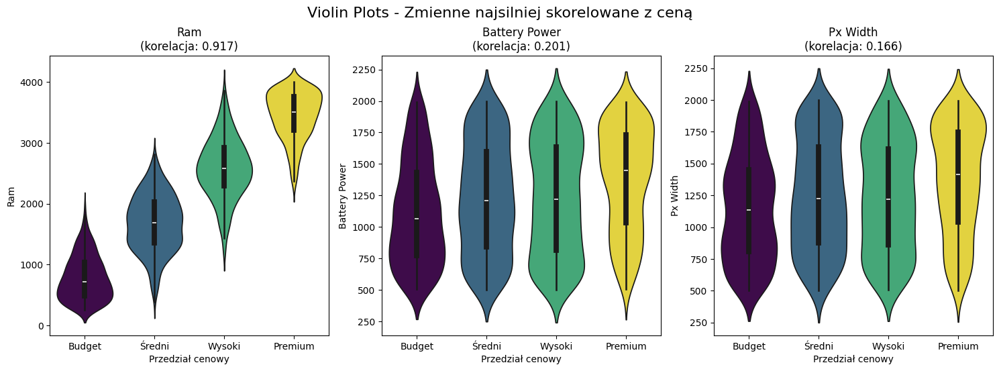

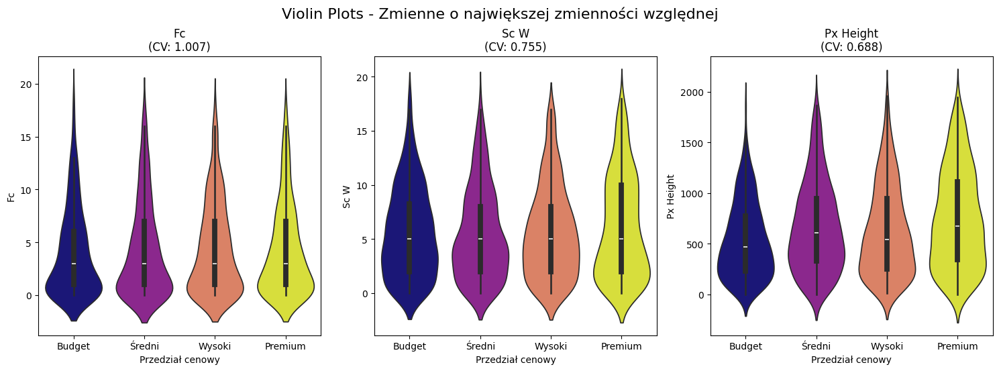


=== ANALIZA PORÓWNAWCZA ===
Zmienne w obu kategoriach:
  Brak wspólnych zmiennych

Unikalne dla korelacji: {'ram', 'px_width', 'battery_power'}
Unikalne dla zmienności: {'fc', 'px_height', 'sc_w'}

=== INSIGHT ===

📊 Violin plots pokazują:
   - Kształty rozkładów w każdym segmencie cenowym
   - Czy segmenty mają różne 'profile' danej cechy
   - Outliers w kontekście całego rozkładu
   - Potencjalne luki rynkowe (brak telefonów w niektórych zakresach)


In [23]:
# Wykresy Skrzypcowe (Violin Plots)
# Wykresy skrzypcowe pokazują rozkład zmiennych oraz ich gęstość. Można je również wykorzystać do porównań między grupami.

# Automatyczny wybór zmiennych do Violin Plots

# 1. NAJSILNIEJ SKORELOWANE Z CENĄ
print("=== 1. ZMIENNE NAJSILNIEJ SKORELOWANE Z CENĄ ===")
price_correlations = df.corr()['price_range'].abs().sort_values(ascending=False)
# Wyklucz zmienne binarne (tylko 0 i 1) i price_range
correlation_vars = []
for var in price_correlations.drop('price_range').index:
    unique_values = set(df[var].unique())
    if not unique_values.issubset({0, 1}):  # Nie binarne
        correlation_vars.append(var)
    if len(correlation_vars) >= 3:  # Weź top 3
        break

print("Top 3 zmienne skorelowane z ceną (wykluczając binarne):")
for var in correlation_vars:
    corr_val = df.corr()['price_range'][var]
    print(f"  {var}: {corr_val:.3f}")

# 2. ZMIENNE O NAJWIĘKSZEJ ZMIENNOŚCI
print("\n=== 2. ZMIENNE O NAJWIĘKSZEJ ZMIENNOŚCI ===")
numeric_vars = df.select_dtypes(include=['number']).columns
# Wyklucz zmienne binarne i price_range
variability_vars = []
for var in numeric_vars:
    if var != 'price_range':
        unique_values = set(df[var].unique())
        if not unique_values.issubset({0, 1}):  # Nie binarne
            variability_vars.append(var)

# Oblicz coefficient of variation (CV) dla porównywalności
cv_scores = {}
for var in variability_vars:
    mean_val = df[var].mean()
    std_val = df[var].std()
    cv = std_val / mean_val if mean_val != 0 else 0
    cv_scores[var] = cv

# Sortuj według CV
sorted_cv = sorted(cv_scores.items(), key=lambda x: x[1], reverse=True)
top_variability_vars = [var for var, cv in sorted_cv[:3]]

print("Top 3 zmienne o największej zmienności względnej (CV):")
for var, cv in sorted_cv[:3]:
    print(f"  {var}: CV = {cv:.3f} (std: {df[var].std():.1f})")

# VIOLIN PLOTS dla zmiennych skorelowanych z ceną
plt.figure(figsize=(15, 10))

for i, var in enumerate(correlation_vars):
    plt.subplot(2, 3, i+1)
    sns.violinplot(data=df, x='price_range', y=var, hue='price_range', 
                   palette='viridis', legend=False)
    plt.title(f'{var.replace("_", " ").title()}\n(korelacja: {df.corr()["price_range"][var]:.3f})')
    plt.xlabel('Przedział cenowy')
    plt.ylabel(var.replace("_", " ").title())
    
    # Dodaj etykiety dla price_range
    plt.xticks([0, 1, 2, 3], ['Budget', 'Średni', 'Wysoki', 'Premium'])

plt.suptitle('Violin Plots - Zmienne najsilniej skorelowane z ceną', fontsize=16)
plt.tight_layout()
plt.show()

# VIOLIN PLOTS dla zmiennych o największej zmienności
plt.figure(figsize=(15, 10))

for i, var in enumerate(top_variability_vars):
    plt.subplot(2, 3, i+1)
    sns.violinplot(data=df, x='price_range', y=var, hue='price_range', 
                   palette='plasma', legend=False)
    plt.title(f'{var.replace("_", " ").title()}\n(CV: {cv_scores[var]:.3f})')
    plt.xlabel('Przedział cenowy')
    plt.ylabel(var.replace("_", " ").title())
    
    # Dodaj etykiety dla price_range
    plt.xticks([0, 1, 2, 3], ['Budget', 'Średni', 'Wysoki', 'Premium'])

plt.suptitle('Violin Plots - Zmienne o największej zmienności względnej', fontsize=16)
plt.tight_layout()
plt.show()

# ANALIZA PORÓWNAWCZA
print("\n=== ANALIZA PORÓWNAWCZA ===")
print("Zmienne w obu kategoriach:")
common_vars = set(correlation_vars) & set(top_variability_vars)
if common_vars:
    print(f"  Wspólne: {list(common_vars)}")
    print("  → Te zmienne są zarówno silnie skorelowane z ceną jak i bardzo zmienne")
else:
    print("  Brak wspólnych zmiennych")

print(f"\nUnikalne dla korelacji: {set(correlation_vars) - set(top_variability_vars)}")
print(f"Unikalne dla zmienności: {set(top_variability_vars) - set(correlation_vars)}")

# INSIGHT
print(f"\n=== INSIGHT ===")
if common_vars:
    print(f"✅ Zmienne {list(common_vars)} to 'złote' predyktory:")
    print("   - Silnie wpływają na cenę")
    print("   - Mają duże zróżnicowanie (łatwo różnicować produkty)")
    print("   - Priorytet #1 w strategii produktowej")

print(f"\n📊 Violin plots pokazują:")
print("   - Kształty rozkładów w każdym segmencie cenowym")
print("   - Czy segmenty mają różne 'profile' danej cechy")
print("   - Outliers w kontekście całego rozkładu")
print("   - Potencjalne luki rynkowe (brak telefonów w niektórych zakresach)")

In [24]:
'''
Zwizualizuj zależności między zmiennymi objaśniającymi i objaśnianą. 
Zastanów się, które z nich będą dobrymy predyktorami zmiennej objaśnaniej 
- wykorzystaj pakiet matplotlib.
Wykres Rozrzutu: Używaj, gdy chcesz zobaczyć relacje między dwiema zmiennymi liczbowymi.
Wykres Pudełkowy: Używaj, gdy masz zmienną objaśnianą jako zmienną kategoryczną i chcesz zobaczyć, jak zmienia się zmienna objaśniająca.
Wykres Liniowy: Można używać go do analizy, jak zmienna objaśniająca zmienia się w funkcji zmiennej objaśnianej, szczególnie jeśli zmienna objaśniająca jest uporządkowana (np. czas).
Wykres Gęstości: Używaj, gdy chcesz zobaczyć rozkład zmiennej objaśnianej w różnych kategoriach zmiennej objaśniającej.
Macierz Rozrzutów: Używaj, gdy masz wiele zmiennych objaśniających i chcesz zobaczyć ich interakcje.
Wykres Korelacji: Używaj, aby zobaczyć liniową zależność między zmiennymi.
'''

'\nZwizualizuj zależności między zmiennymi objaśniającymi i objaśnianą. \nZastanów się, które z nich będą dobrymy predyktorami zmiennej objaśnaniej \n- wykorzystaj pakiet matplotlib.\nWykres Rozrzutu: Używaj, gdy chcesz zobaczyć relacje między dwiema zmiennymi liczbowymi.\nWykres Pudełkowy: Używaj, gdy masz zmienną objaśnianą jako zmienną kategoryczną i chcesz zobaczyć, jak zmienia się zmienna objaśniająca.\nWykres Liniowy: Można używać go do analizy, jak zmienna objaśniająca zmienia się w funkcji zmiennej objaśnianej, szczególnie jeśli zmienna objaśniająca jest uporządkowana (np. czas).\nWykres Gęstości: Używaj, gdy chcesz zobaczyć rozkład zmiennej objaśnianej w różnych kategoriach zmiennej objaśniającej.\nMacierz Rozrzutów: Używaj, gdy masz wiele zmiennych objaśniających i chcesz zobaczyć ich interakcje.\nWykres Korelacji: Używaj, aby zobaczyć liniową zależność między zmiennymi.\n'

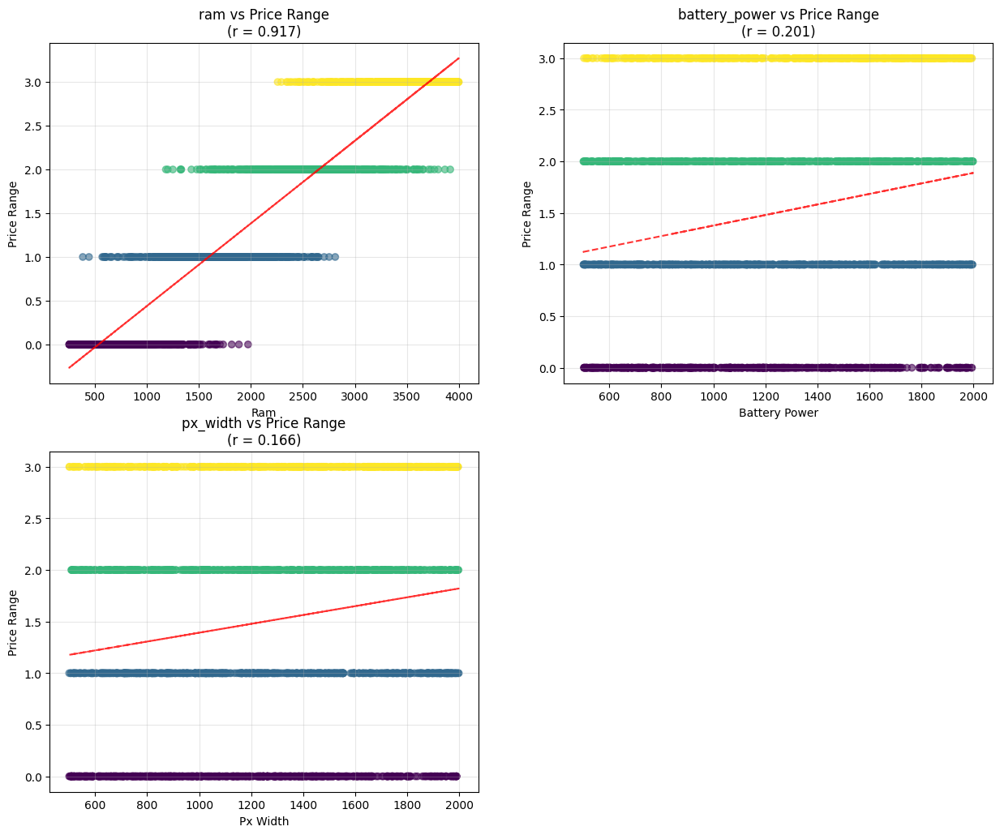

In [25]:
#1. Wykres Rozrzutu (Scatter Plot)
# Cel: Pokazuje, jak dwie zmienne są powiązane ze sobą. 
# W szczególności, pozwala zobaczyć, czy istnieje liniowa lub nieliniowa 
# zależność między zmienną objaśnianą a zmiennymi objaśniającymi.

# Scatter plots dla top predyktorów z price_range
# Automatycznie dostosuj liczbę subplotów
n_predictors = len(correlation_vars)
n_cols = 2
n_rows = (n_predictors + n_cols - 1) // n_cols  # Zaokrąglenie w górę

fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 6*n_rows))
axes = axes.ravel() if n_predictors > 1 else [axes]

for i, var in enumerate(correlation_vars):
    if i < len(axes):
        scatter = axes[i].scatter(df[var], df['price_range'], 
                                 c=df['price_range'], cmap='viridis', alpha=0.6)
        axes[i].set_xlabel(var.replace('_', ' ').title())
        axes[i].set_ylabel('Price Range')
        axes[i].set_title(f'{var} vs Price Range\n(r = {df.corr()["price_range"][var]:.3f})')
        axes[i].grid(True, alpha=0.3)
        
        # Trend line
        z = np.polyfit(df[var], df['price_range'], 1)
        p = np.poly1d(z)
        axes[i].plot(df[var], p(df[var]), "r--", alpha=0.8)

# Ukryj puste subploty
for i in range(n_predictors, len(axes)):
    axes[i].set_visible(False)

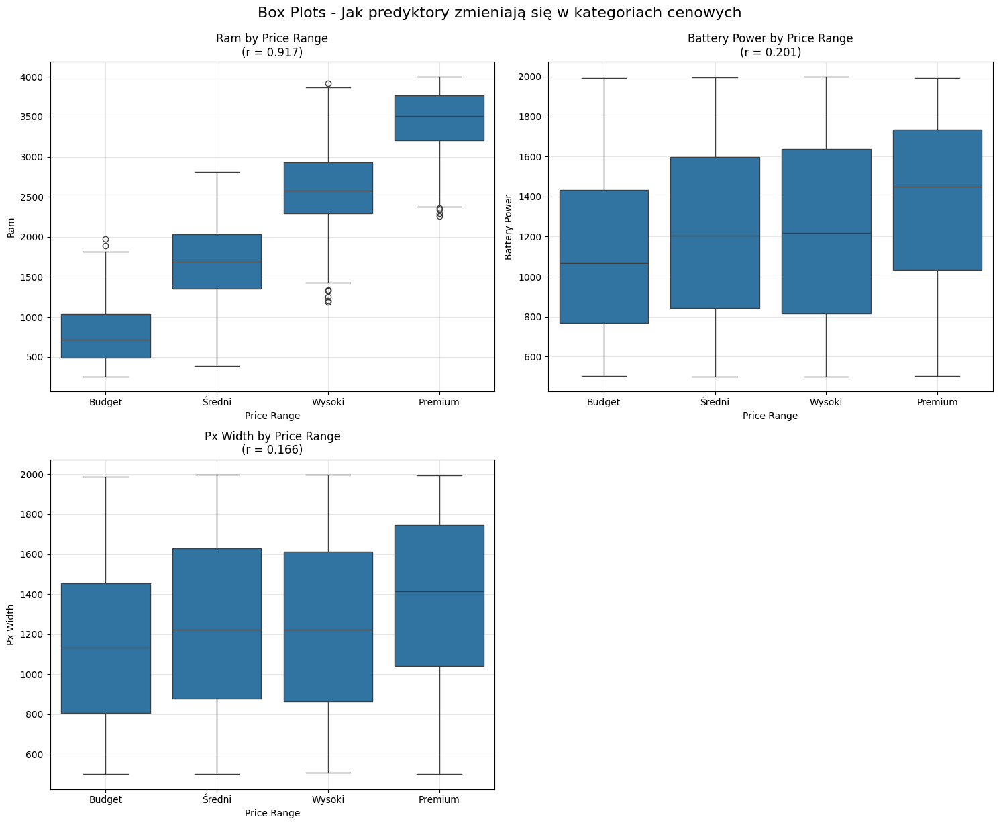

In [26]:
# Box Plots - pokazują mediany, kwartyle, outliers (najlepszy dla analizy)
# Automatycznie wybierz top predyktory dla box plots
n_predictors = min(4, len(correlation_vars))
top_predictors = correlation_vars[:n_predictors]

# Dynamiczny layout
n_cols = 2
n_rows = (n_predictors + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 6*n_rows))
axes = axes.ravel() if n_predictors > 1 else [axes]

for i, var in enumerate(top_predictors):
    sns.boxplot(data=df, x='price_range', y=var, ax=axes[i])
    axes[i].set_title(f'{var.replace("_", " ").title()} by Price Range\n(r = {df.corr()["price_range"][var]:.3f})')
    axes[i].set_xlabel('Price Range')
    axes[i].set_ylabel(var.replace('_', ' ').title())
    
    # POPRAWKA: Najpierw set_xticks, potem set_xticklabels
    axes[i].set_xticks([0, 1, 2, 3])
    axes[i].set_xticklabels(['Budget', 'Średni', 'Wysoki', 'Premium'])
    axes[i].grid(True, alpha=0.3)

# Ukryj puste subploty
for i in range(n_predictors, len(axes)):
    axes[i].set_visible(False)

plt.tight_layout()
plt.suptitle('Box Plots - Jak predyktory zmieniają się w kategoriach cenowych', 
             fontsize=16, y=1.02)
plt.show()

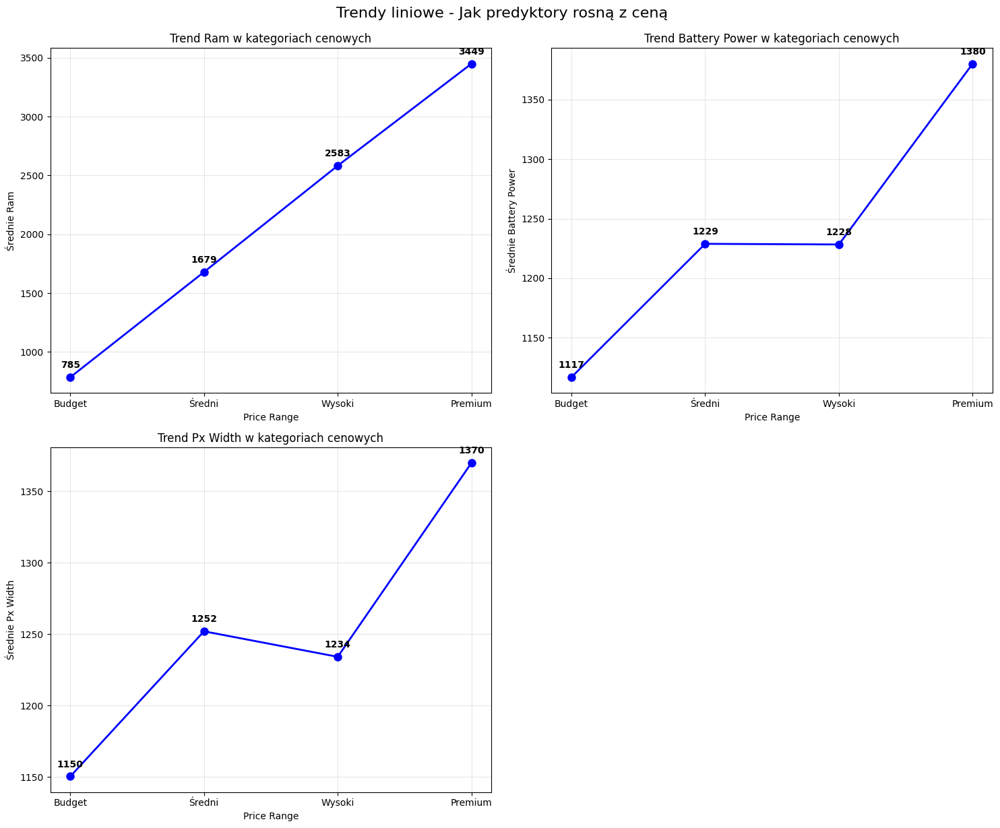

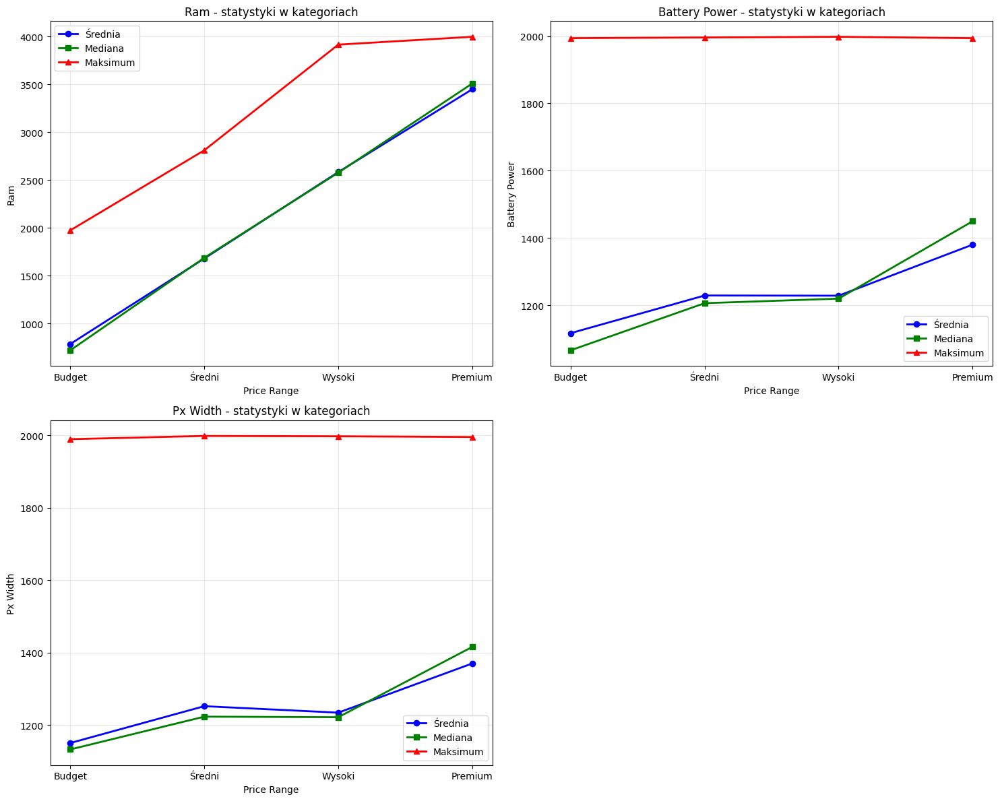

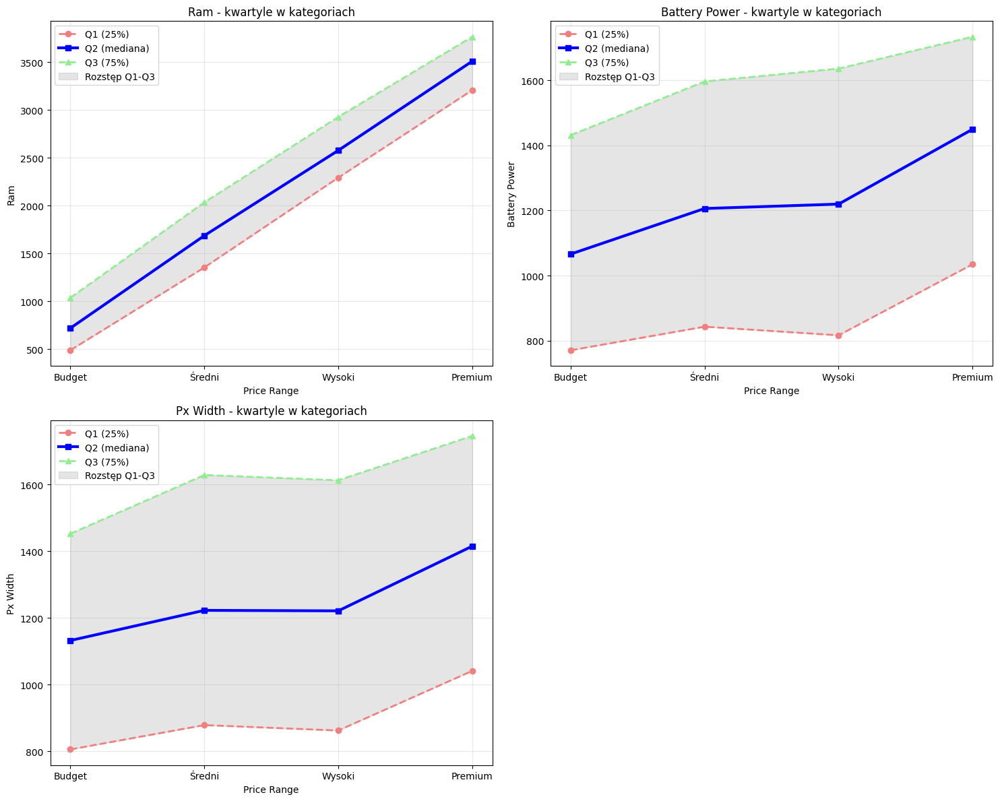

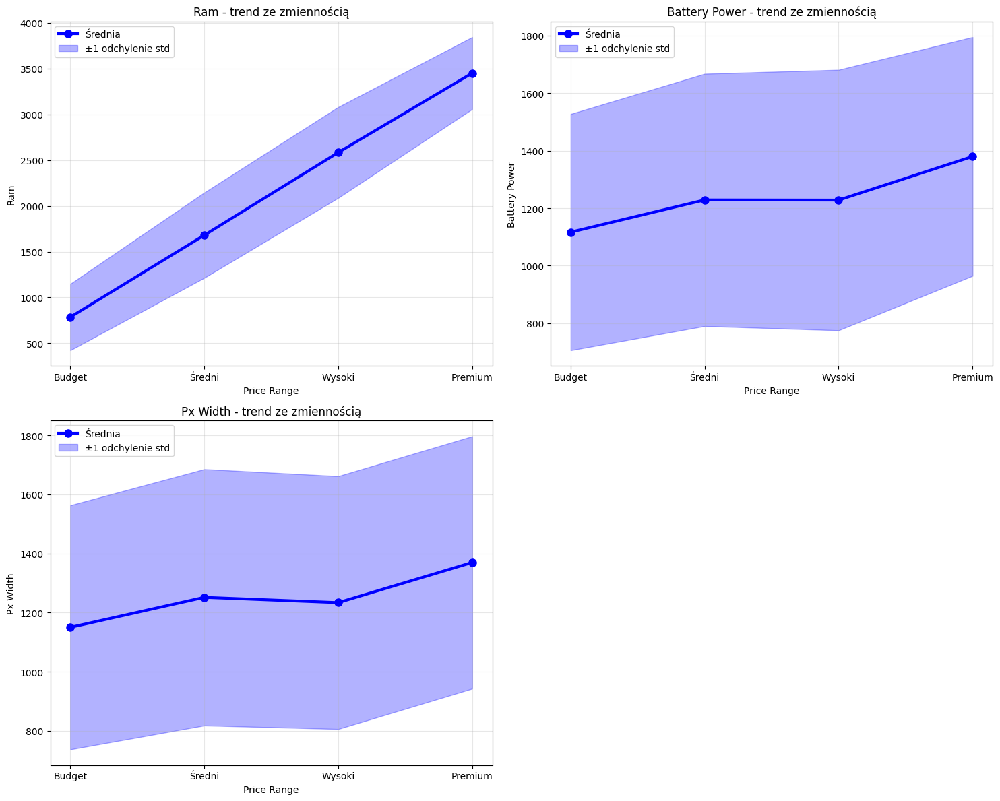

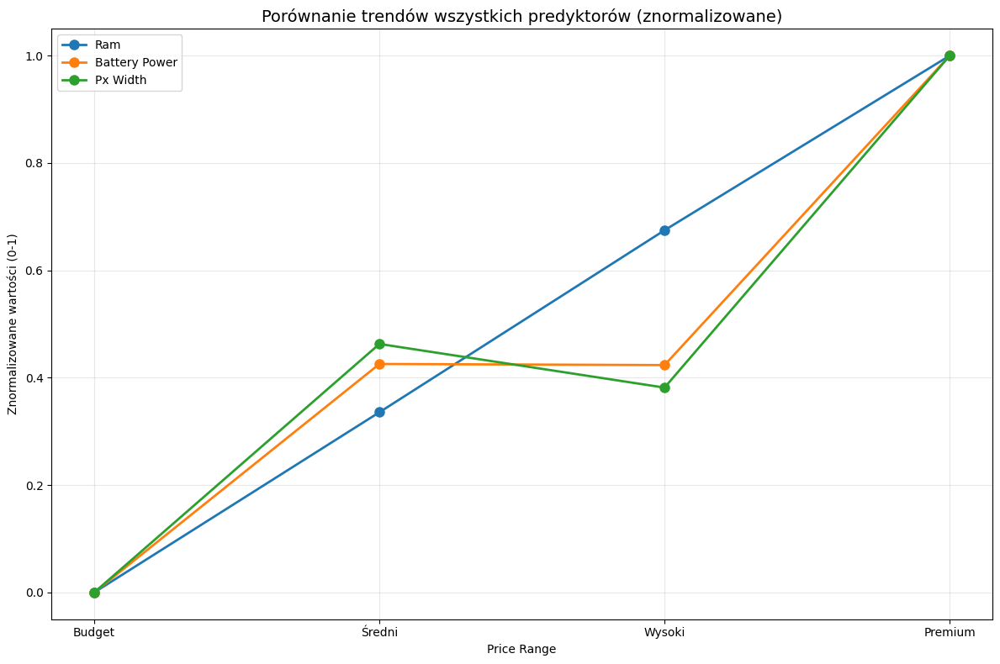

In [27]:
# Wykres Liniowy (Line Plot)
# Trend #1 - podstawowy, pokazuje jak cecha rośnie z ceną
# Liniowe wykresy pokazujące trendy średnich
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 6*n_rows))
axes = axes.ravel() if n_predictors > 1 else [axes]

for i, var in enumerate(top_predictors):
    # Oblicz średnie per kategoria
    means = df.groupby('price_range')[var].mean()
    
    axes[i].plot(means.index, means.values, marker='o', linewidth=2, 
                markersize=8, color='blue', label='Średnia')
    axes[i].set_title(f'Trend {var.replace("_", " ").title()} w kategoriach cenowych')
    axes[i].set_xlabel('Price Range')
    axes[i].set_ylabel(f'Średnie {var.replace("_", " ").title()}')
    axes[i].set_xticks(range(4))
    axes[i].set_xticklabels(['Budget', 'Średni', 'Wysoki', 'Premium'])
    axes[i].grid(True, alpha=0.3)
    
    # Dodaj wartości na punktach
    for x, y in zip(means.index, means.values):
        axes[i].annotate(f'{y:.0f}', (x, y), textcoords="offset points", 
                        xytext=(0,10), ha='center', fontweight='bold')

# Ukryj puste subploty
for i in range(n_predictors, len(axes)):
    axes[i].set_visible(False)

plt.tight_layout()
plt.suptitle('Trendy liniowe - Jak predyktory rosną z ceną', fontsize=16, y=1.02)
plt.show()

# Trend #2 - porównanie różnych statystyk
# Porównanie różnych statystyk (średnia, mediana, max)
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 6*n_rows))
axes = axes.ravel() if n_predictors > 1 else [axes]

for i, var in enumerate(top_predictors):
    # Oblicz różne statystyki
    stats = df.groupby('price_range')[var].agg(['mean', 'median', 'max'])
    
    axes[i].plot(stats.index, stats['mean'], marker='o', linewidth=2, 
                label='Średnia', color='blue')
    axes[i].plot(stats.index, stats['median'], marker='s', linewidth=2, 
                label='Mediana', color='green')
    axes[i].plot(stats.index, stats['max'], marker='^', linewidth=2, 
                label='Maksimum', color='red')
    
    axes[i].set_title(f'{var.replace("_", " ").title()} - statystyki w kategoriach')
    axes[i].set_xlabel('Price Range')
    axes[i].set_ylabel(var.replace('_', ' ').title())
    axes[i].set_xticks(range(4))
    axes[i].set_xticklabels(['Budget', 'Średni', 'Wysoki', 'Premium'])
    axes[i].legend()
    axes[i].grid(True, alpha=0.3)

# Ukryj puste subploty
for i in range(n_predictors, len(axes)):
    axes[i].set_visible(False)

plt.tight_layout()
plt.show()

# Trend #3 - pełny obraz rozkładu (kwartyle)
# Kwartyle jako linie trendu
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 6*n_rows))
axes = axes.ravel() if n_predictors > 1 else [axes]

for i, var in enumerate(top_predictors):
    # Oblicz kwartyle
    quartiles = df.groupby('price_range')[var].quantile([0.25, 0.5, 0.75]).unstack()
    
    axes[i].plot(quartiles.index, quartiles[0.25], marker='o', linewidth=2, 
                label='Q1 (25%)', color='lightcoral', linestyle='--')
    axes[i].plot(quartiles.index, quartiles[0.5], marker='s', linewidth=3, 
                label='Q2 (mediana)', color='blue')
    axes[i].plot(quartiles.index, quartiles[0.75], marker='^', linewidth=2, 
                label='Q3 (75%)', color='lightgreen', linestyle='--')
    
    # Wypełnij obszar między Q1 i Q3
    axes[i].fill_between(quartiles.index, quartiles[0.25], quartiles[0.75], 
                        alpha=0.2, color='gray', label='Rozstęp Q1-Q3')
    
    axes[i].set_title(f'{var.replace("_", " ").title()} - kwartyle w kategoriach')
    axes[i].set_xlabel('Price Range')
    axes[i].set_ylabel(var.replace('_', ' ').title())
    axes[i].set_xticks(range(4))
    axes[i].set_xticklabels(['Budget', 'Średni', 'Wysoki', 'Premium'])
    axes[i].legend()
    axes[i].grid(True, alpha=0.3)

# Ukryj puste subploty
for i in range(n_predictors, len(axes)):
    axes[i].set_visible(False)

plt.tight_layout()
plt.show()

# Trend #4 - trend + zmienność
# Średnia z pasmem odchylenia standardowego
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 6*n_rows))
axes = axes.ravel() if n_predictors > 1 else [axes]

for i, var in enumerate(top_predictors):
    # Oblicz średnią i odchylenie
    means = df.groupby('price_range')[var].mean()
    stds = df.groupby('price_range')[var].std()
    
    axes[i].plot(means.index, means.values, marker='o', linewidth=3, 
                markersize=8, color='blue', label='Średnia')
    
    # Dodaj pasmo odchylenia
    axes[i].fill_between(means.index, means - stds, means + stds, 
                        alpha=0.3, color='blue', label='±1 odchylenie std')
    
    axes[i].set_title(f'{var.replace("_", " ").title()} - trend ze zmiennością')
    axes[i].set_xlabel('Price Range')
    axes[i].set_ylabel(var.replace('_', ' ').title())
    axes[i].set_xticks(range(4))
    axes[i].set_xticklabels(['Budget', 'Średni', 'Wysoki', 'Premium'])
    axes[i].legend()
    axes[i].grid(True, alpha=0.3)

# Ukryj puste subploty
for i in range(n_predictors, len(axes)):
    axes[i].set_visible(False)

plt.tight_layout()
plt.show()

# Trend #5 - porównanie wszystkich predyktorów
# Porównanie trendów wszystkich predyktorów
plt.figure(figsize=(12, 8))

# Normalizuj do 0-1 dla porównywalności
for var in top_predictors:
    means = df.groupby('price_range')[var].mean()
    # Normalizacja min-max
    normalized = (means - means.min()) / (means.max() - means.min())
    
    plt.plot(normalized.index, normalized.values, marker='o', linewidth=2, 
            markersize=8, label=f'{var.replace("_", " ").title()}')

plt.title('Porównanie trendów wszystkich predyktorów (znormalizowane)', fontsize=14)
plt.xlabel('Price Range')
plt.ylabel('Znormalizowane wartości (0-1)')
plt.xticks(range(4), ['Budget', 'Średni', 'Wysoki', 'Premium'])
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

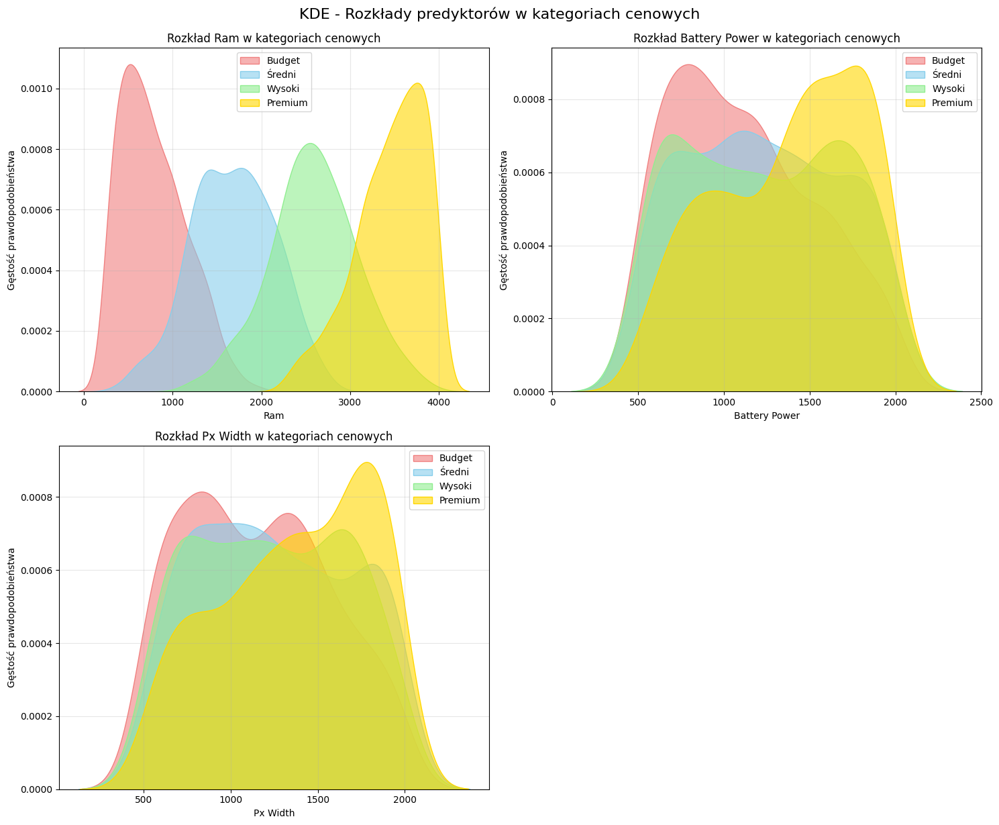

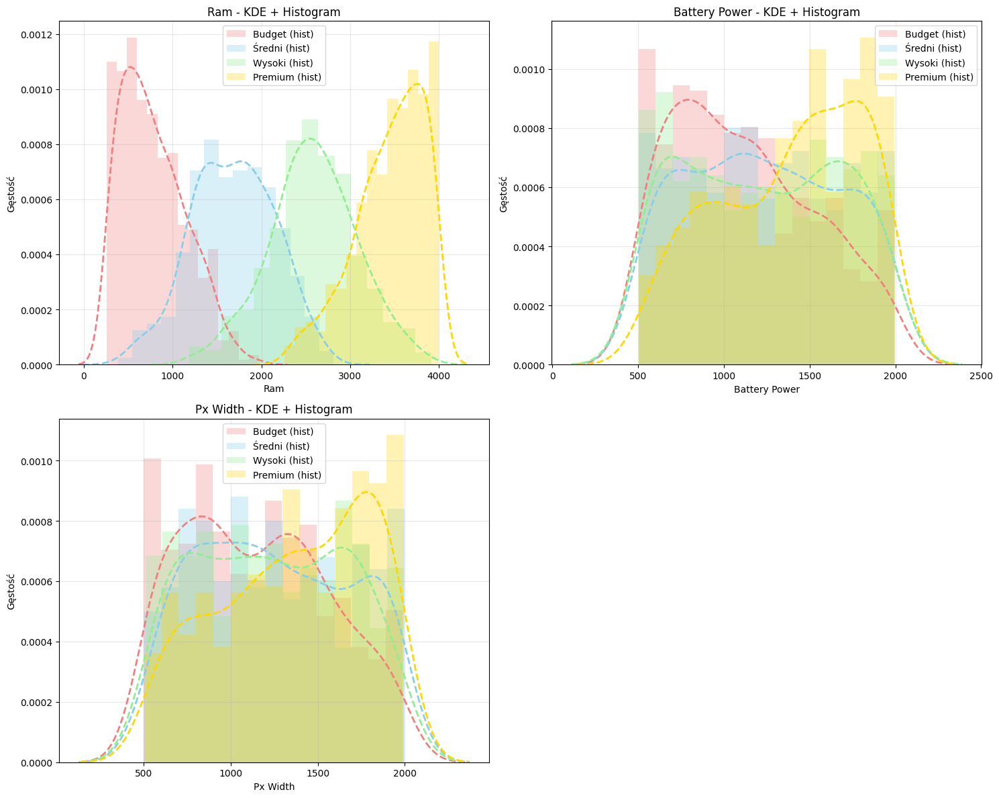

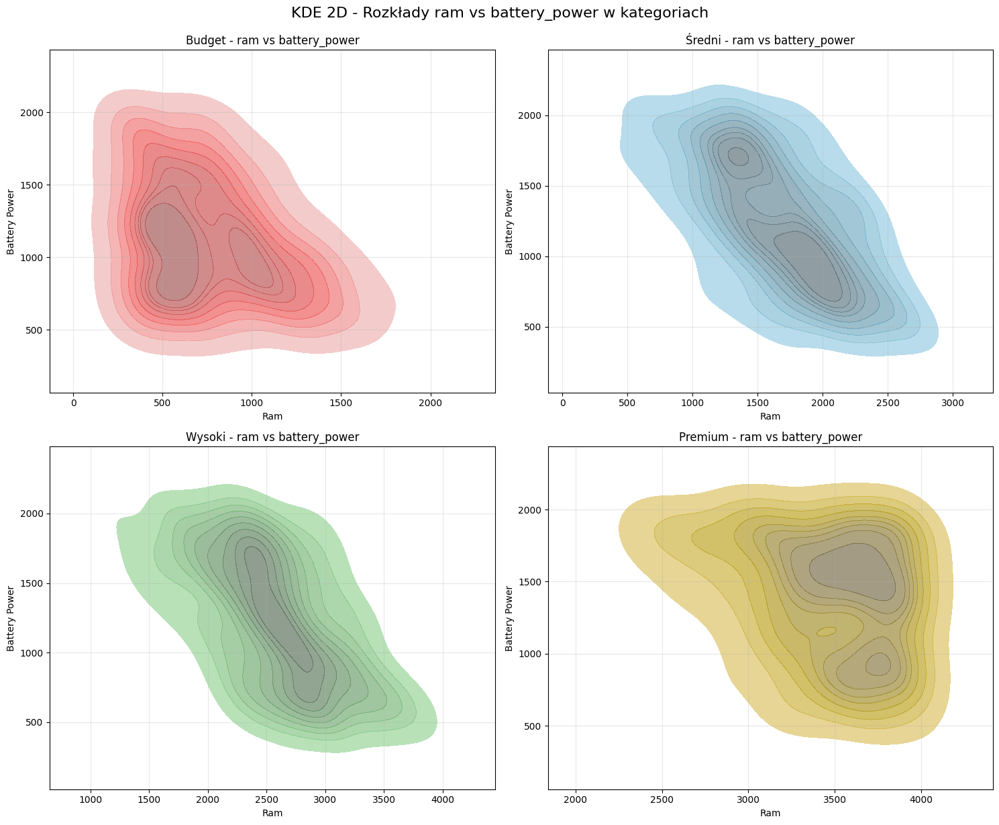

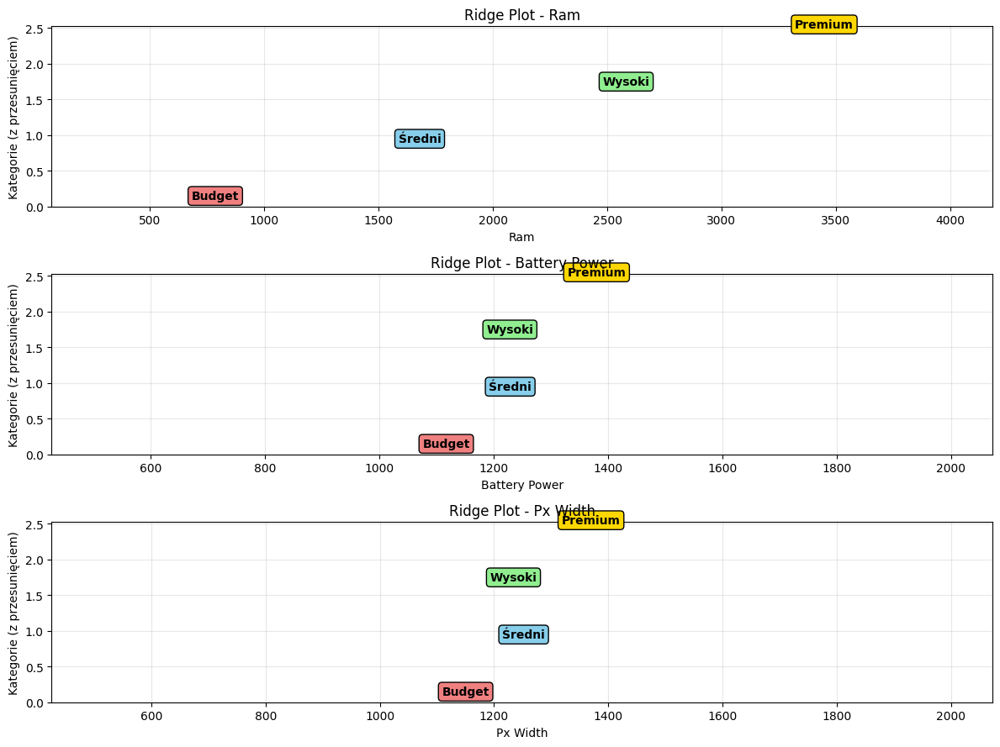

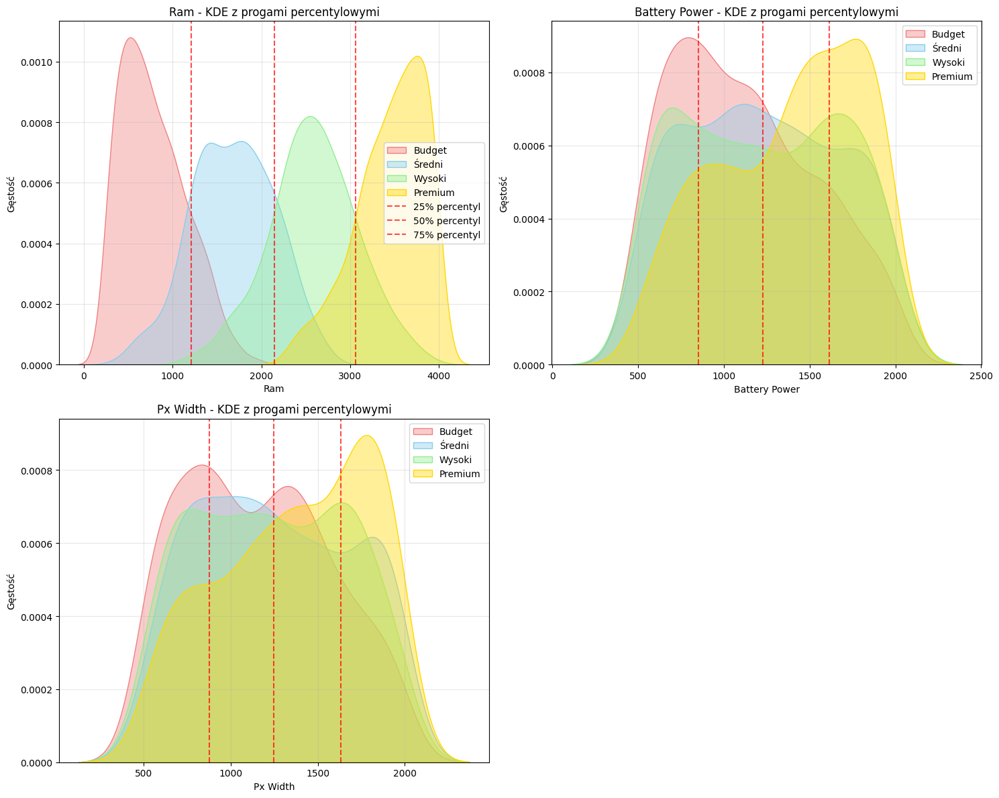

In [28]:
# Wykres Gęstości (KDE Plot)
# KDE #1 - podstawowy, pokazuje jak rozkłady różnią się między segmentami
# KDE plots pokazujące rozkłady predyktorów w różnych price_range
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 6*n_rows))
axes = axes.ravel() if n_predictors > 1 else [axes]

segments = ['Budget', 'Średni', 'Wysoki', 'Premium']
colors = ['lightcoral', 'skyblue', 'lightgreen', 'gold']

for i, var in enumerate(top_predictors):
    for price_cat in range(4):
        segment_data = df[df['price_range'] == price_cat][var]
        if len(segment_data) > 0:
            sns.kdeplot(segment_data, ax=axes[i], label=f'{segments[price_cat]}',
                       color=colors[price_cat], fill=True, alpha=0.6)
    
    axes[i].set_title(f'Rozkład {var.replace("_", " ").title()} w kategoriach cenowych')
    axes[i].set_xlabel(var.replace('_', ' ').title())
    axes[i].set_ylabel('Gęstość prawdopodobieństwa')
    axes[i].legend()
    axes[i].grid(True, alpha=0.3)

# Ukryj puste subploty
for i in range(n_predictors, len(axes)):
    axes[i].set_visible(False)

plt.tight_layout()
plt.suptitle('KDE - Rozkłady predyktorów w kategoriach cenowych', fontsize=16, y=1.02)
plt.show()

# KDE #2 - połączenie z histogramem dla lepszego zrozumienia
# Kombinacja KDE + histogram dla lepszego zrozumienia
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 6*n_rows))
axes = axes.ravel() if n_predictors > 1 else [axes]

for i, var in enumerate(top_predictors):
    for price_cat in range(4):
        segment_data = df[df['price_range'] == price_cat][var]
        if len(segment_data) > 0:
            # Histogram z przezroczystością
            axes[i].hist(segment_data, bins=15, alpha=0.3, color=colors[price_cat],
                        density=True, label=f'{segments[price_cat]} (hist)')
            # KDE na górze
            sns.kdeplot(segment_data, ax=axes[i], color=colors[price_cat], 
                       linewidth=2, linestyle='--')
    
    axes[i].set_title(f'{var.replace("_", " ").title()} - KDE + Histogram')
    axes[i].set_xlabel(var.replace('_', ' ').title())
    axes[i].set_ylabel('Gęstość')
    axes[i].legend()
    axes[i].grid(True, alpha=0.3)

# Ukryj puste subploty
for i in range(n_predictors, len(axes)):
    axes[i].set_visible(False)

plt.tight_layout()
plt.show()

# KDE #3 - 2D analiza relacji między predyktorami
# 2D KDE dla par predyktorów kolorowane przez price_range
if len(top_predictors) >= 2:
    fig, axes = plt.subplots(2, 2, figsize=(15, 12))
    axes = axes.ravel()
    
    # Wszystkie możliwe pary top 2 predyktorów
    var1, var2 = top_predictors[0], top_predictors[1]
    
    for price_cat in range(4):
        segment_data = df[df['price_range'] == price_cat]
        if len(segment_data) > 10:  # Minimum punktów dla KDE 2D
            sns.kdeplot(data=segment_data, x=var1, y=var2, ax=axes[price_cat],
                       fill=True, alpha=0.6, color=colors[price_cat])
            axes[price_cat].set_title(f'{segments[price_cat]} - {var1} vs {var2}')
            axes[price_cat].set_xlabel(var1.replace('_', ' ').title())
            axes[price_cat].set_ylabel(var2.replace('_', ' ').title())
            axes[price_cat].grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.suptitle(f'KDE 2D - Rozkłady {var1} vs {var2} w kategoriach', fontsize=16, y=1.02)
    plt.show()

# KDE #4 - ridge plot, elegancki sposób porównania
# Ridge plot (stacked KDE) - elegancki sposób pokazania wszystkich rozkładów
fig, axes = plt.subplots(len(top_predictors), 1, figsize=(12, 3*len(top_predictors)))
if len(top_predictors) == 1:
    axes = [axes]

for i, var in enumerate(top_predictors):
    for j, price_cat in enumerate(range(4)):
        segment_data = df[df['price_range'] == price_cat][var]
        if len(segment_data) > 0:
            # Prosty histogram z przesunięciem
            y_offset = j * 0.8
            
            # Histogram z przesunięciem
            counts, bins, patches = axes[i].hist(segment_data, bins=20, 
                                               alpha=0.7, color=colors[price_cat],
                                               density=True, bottom=y_offset)
            
            # Etykieta
            axes[i].text(segment_data.mean(), y_offset + 0.1, segments[price_cat],
                        ha='center', fontweight='bold', 
                        bbox=dict(boxstyle="round,pad=0.3", facecolor=colors[price_cat]))
    
    axes[i].set_title(f'Ridge Plot - {var.replace("_", " ").title()}')
    axes[i].set_xlabel(var.replace('_', ' ').title())
    axes[i].set_ylabel('Kategorie (z przesunięciem)')
    axes[i].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# KDE #5 - z progami decyzyjnymi dla strategii
# KDE z zaznaczonymi percentylami (progi)
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 6*n_rows))
axes = axes.ravel() if n_predictors > 1 else [axes]

for i, var in enumerate(top_predictors):
    # Główne KDE
    for price_cat in range(4):
        segment_data = df[df['price_range'] == price_cat][var]
        if len(segment_data) > 0:
            sns.kdeplot(segment_data, ax=axes[i], label=f'{segments[price_cat]}',
                       color=colors[price_cat], fill=True, alpha=0.4)
    
    # Dodaj percentyle jako linie pionowe
    overall_data = df[var]
    percentiles = [25, 50, 75]
    for p in percentiles:
        p_val = np.percentile(overall_data, p)
        axes[i].axvline(p_val, color='red', linestyle='--', alpha=0.7,
                       label=f'{p}% percentyl' if i == 0 else "")
    
    axes[i].set_title(f'{var.replace("_", " ").title()} - KDE z progami percentylowymi')
    axes[i].set_xlabel(var.replace('_', ' ').title())
    axes[i].set_ylabel('Gęstość')
    axes[i].legend()
    axes[i].grid(True, alpha=0.3)

# Ukryj puste subploty
for i in range(n_predictors, len(axes)):
    axes[i].set_visible(False)

plt.tight_layout()
plt.show()

<Figure size 1500x1200 with 0 Axes>

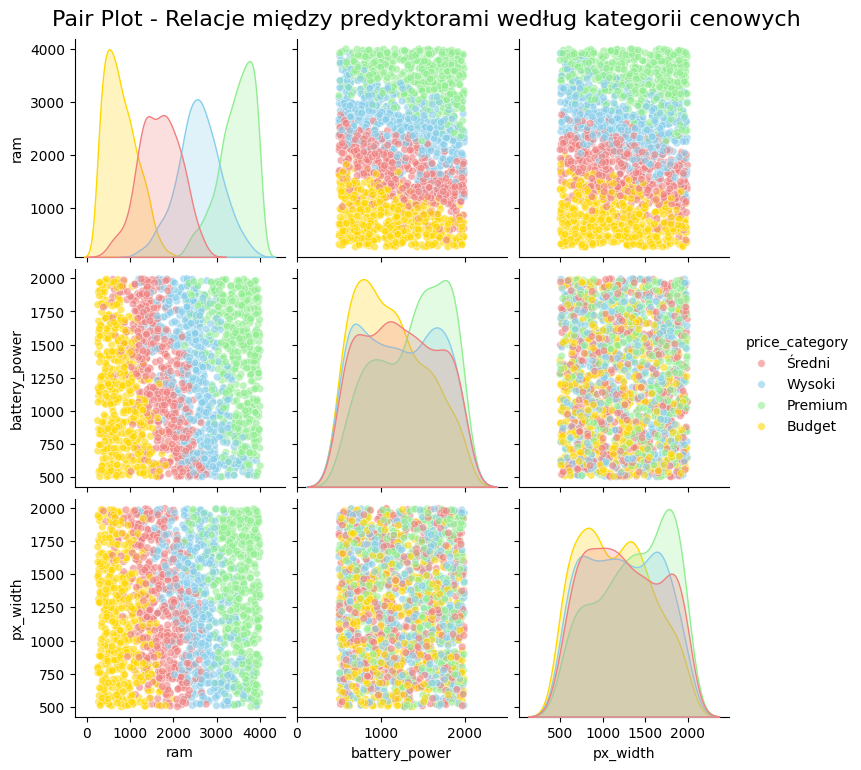

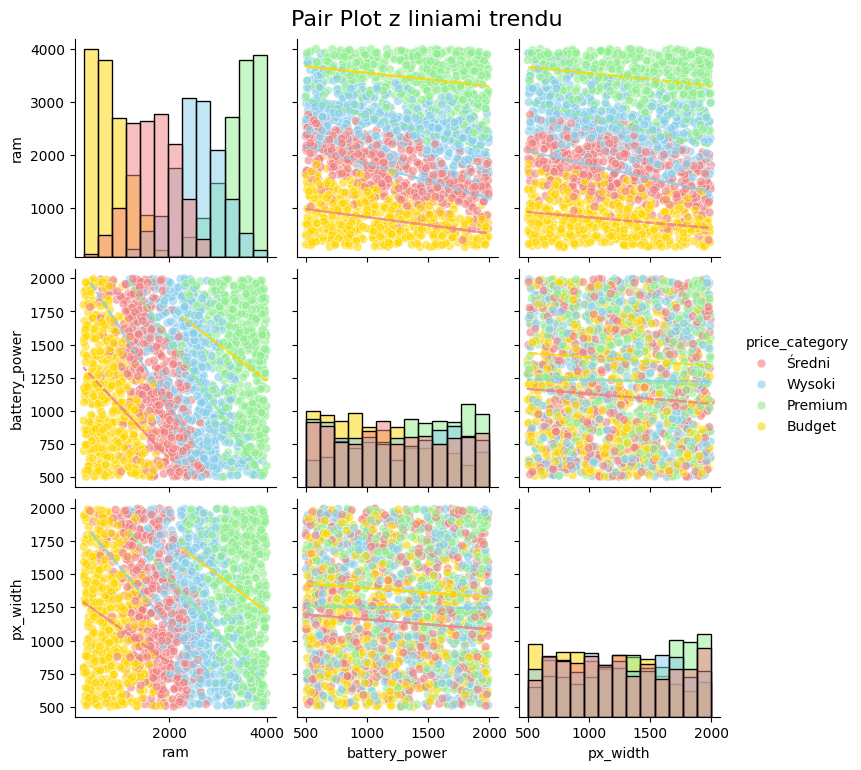

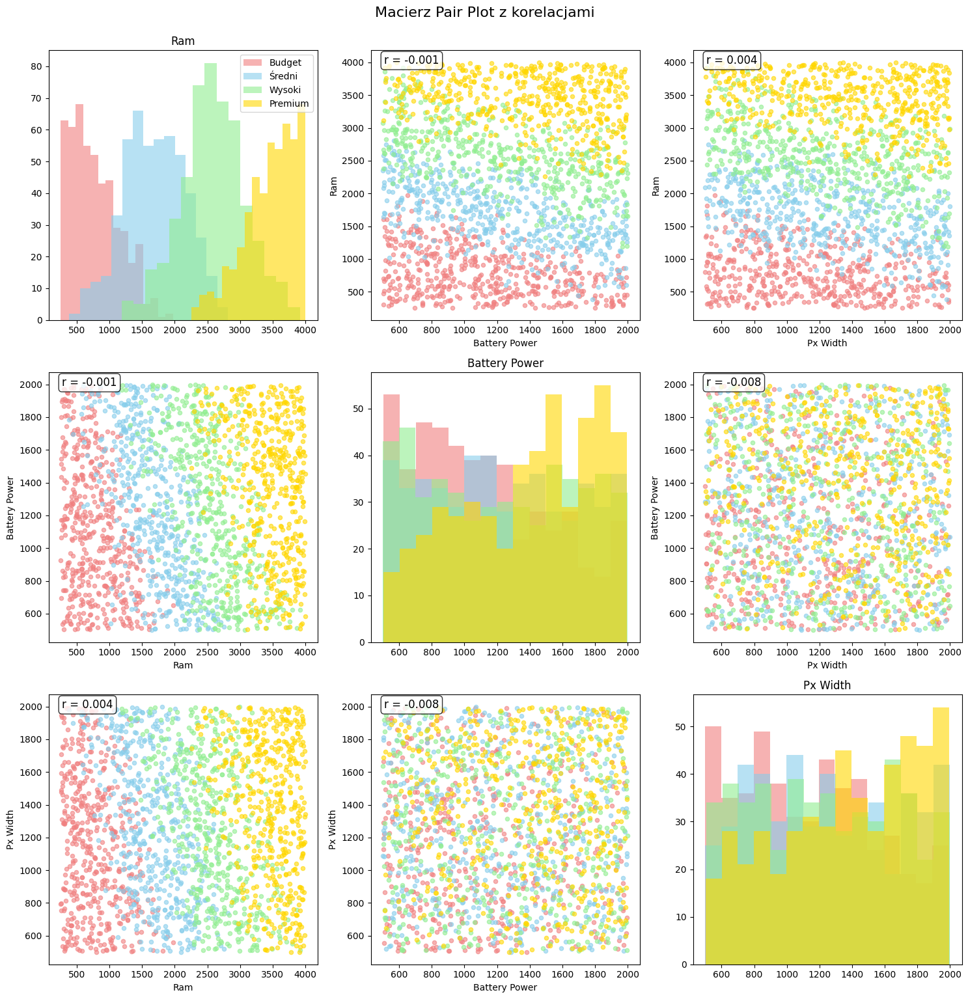

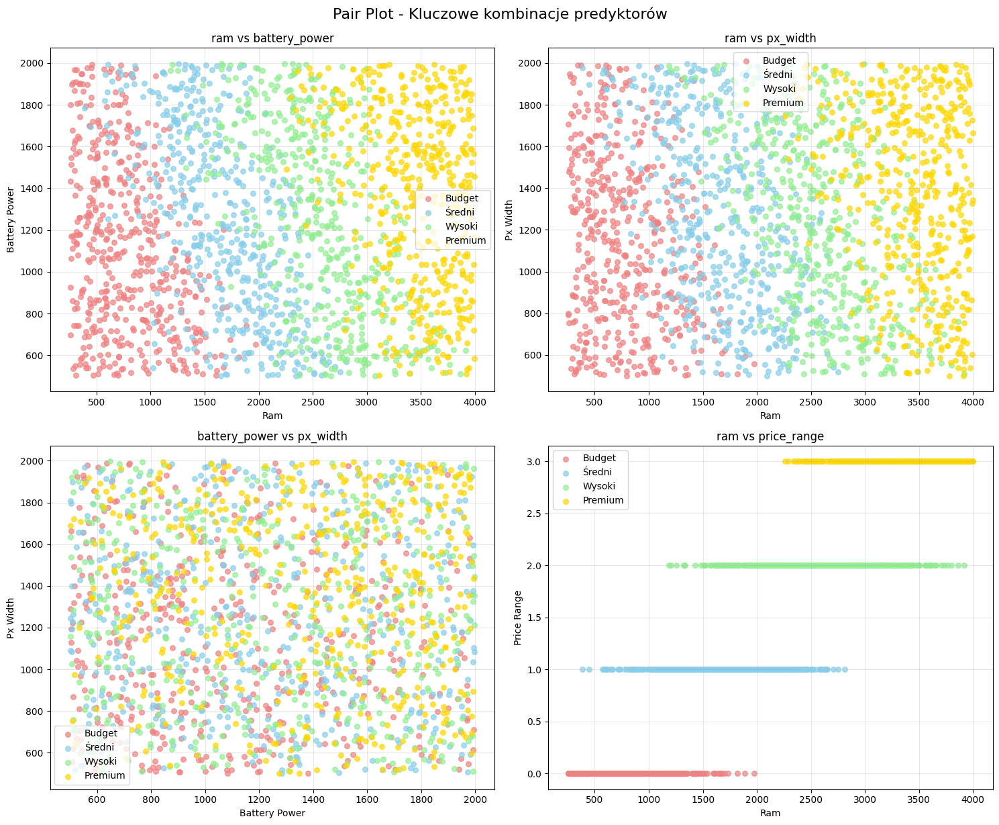

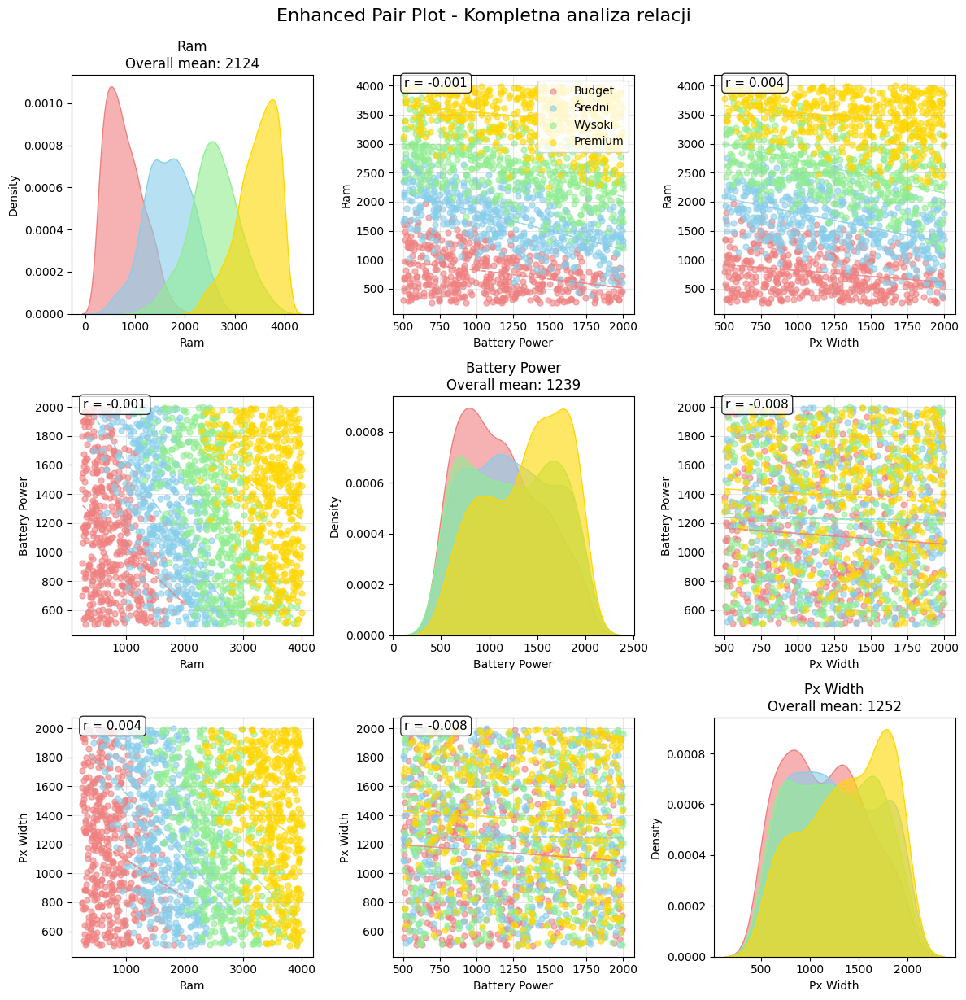

In [29]:
# Macierz Rozrzutów (Pair Plot)
# 1. Pair plot dla top predyktorów z price_range jako kolor
import seaborn as sns

# Wybierz top predyktory + price_range
plot_vars = top_predictors[:4] + ['price_range']  # Max 4 predyktory + target
plot_df = df[plot_vars].copy()

# Dodaj kategoryczne etykiety
plot_df['price_category'] = plot_df['price_range'].map({
    0: 'Budget', 1: 'Średni', 2: 'Wysoki', 3: 'Premium'
})

# Pair plot
plt.figure(figsize=(15, 12))
pair_plot = sns.pairplot(plot_df, hue='price_category', 
                        vars=top_predictors[:4],  # Tylko predyktory
                        palette=['lightcoral', 'skyblue', 'lightgreen', 'gold'],
                        diag_kind='kde',  # KDE na diagonali
                        plot_kws={'alpha': 0.6, 's': 30})

pair_plot.fig.suptitle('Pair Plot - Relacje między predyktorami według kategorii cenowych', 
                      fontsize=16, y=1.02)
plt.show()

# 2. Pair plot z customizacją typu wykresów
def custom_scatter(x, y, **kwargs):
    plt.scatter(x, y, **kwargs)
    # Dodaj trend line
    z = np.polyfit(x, y, 1)
    p = np.poly1d(z)
    plt.plot(x, p(x), "r--", alpha=0.8)

def custom_hist(x, **kwargs):
    plt.hist(x, alpha=0.7, **kwargs)

# Pair plot z custom funkcjami
pair_plot = sns.pairplot(plot_df, hue='price_category',
                        vars=top_predictors[:3],
                        palette=['lightcoral', 'skyblue', 'lightgreen', 'gold'],
                        diag_kind='hist',
                        plot_kws={'alpha': 0.6, 's': 40})

# Dodaj trend lines
for i in range(len(top_predictors[:3])):
    for j in range(len(top_predictors[:3])):
        if i != j:
            ax = pair_plot.axes[i, j]
            for price_cat in range(4):
                segment_data = df[df['price_range'] == price_cat]
                if len(segment_data) > 1:
                    x_data = segment_data[top_predictors[j]]
                    y_data = segment_data[top_predictors[i]]
                    z = np.polyfit(x_data, y_data, 1)
                    p = np.poly1d(z)
                    ax.plot(x_data, p(x_data), "--", alpha=0.8, 
                           color=['lightcoral', 'skyblue', 'lightgreen', 'gold'][price_cat])

plt.suptitle('Pair Plot z liniami trendu', fontsize=16, y=1.02)
plt.show()

# 3. Kombinacja pair plot + macierz korelacji
fig, axes = plt.subplots(len(top_predictors), len(top_predictors), 
                        figsize=(15, 15))

for i, var1 in enumerate(top_predictors):
    for j, var2 in enumerate(top_predictors):
        if i == j:
            # Diagonal - histogram
            for price_cat in range(4):
                segment_data = df[df['price_range'] == price_cat][var1]
                axes[i, j].hist(segment_data, alpha=0.6, color=colors[price_cat],
                               label=segments[price_cat], bins=15)
            axes[i, j].set_title(f'{var1.replace("_", " ").title()}')
            if i == 0:
                axes[i, j].legend()
        else:
            # Off-diagonal - scatter z korelacją
            for price_cat in range(4):
                segment_data = df[df['price_range'] == price_cat]
                axes[i, j].scatter(segment_data[var2], segment_data[var1],
                                  alpha=0.6, color=colors[price_cat], s=20)
            
            # Dodaj korelację jako tekst
            correlation = df[var1].corr(df[var2])
            axes[i, j].text(0.05, 0.95, f'r = {correlation:.3f}',
                           transform=axes[i, j].transAxes, fontsize=12,
                           bbox=dict(boxstyle="round,pad=0.3", facecolor='white', alpha=0.8))
            
            axes[i, j].set_xlabel(var2.replace('_', ' ').title())
            axes[i, j].set_ylabel(var1.replace('_', ' ').title())

plt.tight_layout()
plt.suptitle('Macierz Pair Plot z korelacjami', fontsize=16, y=1.02)
plt.show()

# 4. Pair plot z różnymi miarami relacji
fig, axes = plt.subplots(2, 2, figsize=(15, 12))
axes = axes.ravel()

combinations = [
    (top_predictors[0], top_predictors[1]),
    (top_predictors[0], top_predictors[2] if len(top_predictors) > 2 else top_predictors[1]),
    (top_predictors[1], top_predictors[2] if len(top_predictors) > 2 else top_predictors[0]),
    (top_predictors[0], 'price_range')
]

for idx, (var1, var2) in enumerate(combinations):
    if idx < 4:
        for price_cat in range(4):
            segment_data = df[df['price_range'] == price_cat]
            axes[idx].scatter(segment_data[var1], segment_data[var2],
                             alpha=0.7, color=colors[price_cat], 
                             label=segments[price_cat], s=30)
        
        axes[idx].set_xlabel(var1.replace('_', ' ').title())
        axes[idx].set_ylabel(var2.replace('_', ' ').title())
        axes[idx].set_title(f'{var1} vs {var2}')
        axes[idx].legend()
        axes[idx].grid(True, alpha=0.3)

plt.tight_layout()
plt.suptitle('Pair Plot - Kluczowe kombinacje predyktorów', fontsize=16, y=1.02)
plt.show()

# 5. Pair plot z dodatkowymi informacjami
def enhanced_pair_plot(df, predictors, target='price_range'):
    n_vars = len(predictors)
    fig, axes = plt.subplots(n_vars, n_vars, figsize=(4*n_vars, 4*n_vars))
    
    for i, var1 in enumerate(predictors):
        for j, var2 in enumerate(predictors):
            if i == j:
                # Diagonal - KDE dla każdej kategorii
                for price_cat in range(4):
                    segment_data = df[df[target] == price_cat][var1]
                    if len(segment_data) > 0:
                        sns.kdeplot(segment_data, ax=axes[i, j], 
                                   fill=True, alpha=0.6, color=colors[price_cat])
                
                axes[i, j].set_title(f'{var1.replace("_", " ").title()}\n'
                                    f'Overall mean: {df[var1].mean():.0f}')
                axes[i, j].set_xlabel(var1.replace('_', ' ').title())
                
            else:
                # Off-diagonal - scatter z trend lines
                for price_cat in range(4):
                    segment_data = df[df[target] == price_cat]
                    if len(segment_data) > 1:
                        x = segment_data[var2]
                        y = segment_data[var1]
                        
                        # Scatter
                        axes[i, j].scatter(x, y, alpha=0.6, color=colors[price_cat],
                                          s=25, label=segments[price_cat])
                        
                        # Trend line
                        if len(x) > 1 and x.std() > 0:
                            z = np.polyfit(x, y, 1)
                            p = np.poly1d(z)
                            axes[i, j].plot(x, p(x), "--", alpha=0.8, 
                                           color=colors[price_cat], linewidth=1)
                
                # Ogólna korelacja
                correlation = df[var1].corr(df[var2])
                axes[i, j].text(0.05, 0.95, f'r = {correlation:.3f}',
                               transform=axes[i, j].transAxes, fontsize=11,
                               bbox=dict(boxstyle="round,pad=0.3", 
                                        facecolor='white', alpha=0.8))
                
                axes[i, j].set_xlabel(var2.replace('_', ' ').title())
                axes[i, j].set_ylabel(var1.replace('_', ' ').title())
                axes[i, j].grid(True, alpha=0.3)
                
                if i == 0 and j == 1:  # Legenda tylko raz
                    axes[i, j].legend(loc='upper right')
    
    plt.tight_layout()
    plt.suptitle('Enhanced Pair Plot - Kompletna analiza relacji', fontsize=16, y=1.02)
    plt.show()

# Użycie
enhanced_pair_plot(df, top_predictors[:3])

In [30]:
# 6. Wykres Korelacji (Correlation Heatmap)
# Już robiliśmy wcześniej wybrane korelacje


In [31]:
# Poszukaj ciekawych wizualizacji w galerii pakietu seaborn - https://seaborn.pydata.org/examples/index.html i wykorzystaj zobrazowania ciekawych zależności - (także pomiędzy zmiennymi objaśniającymi).

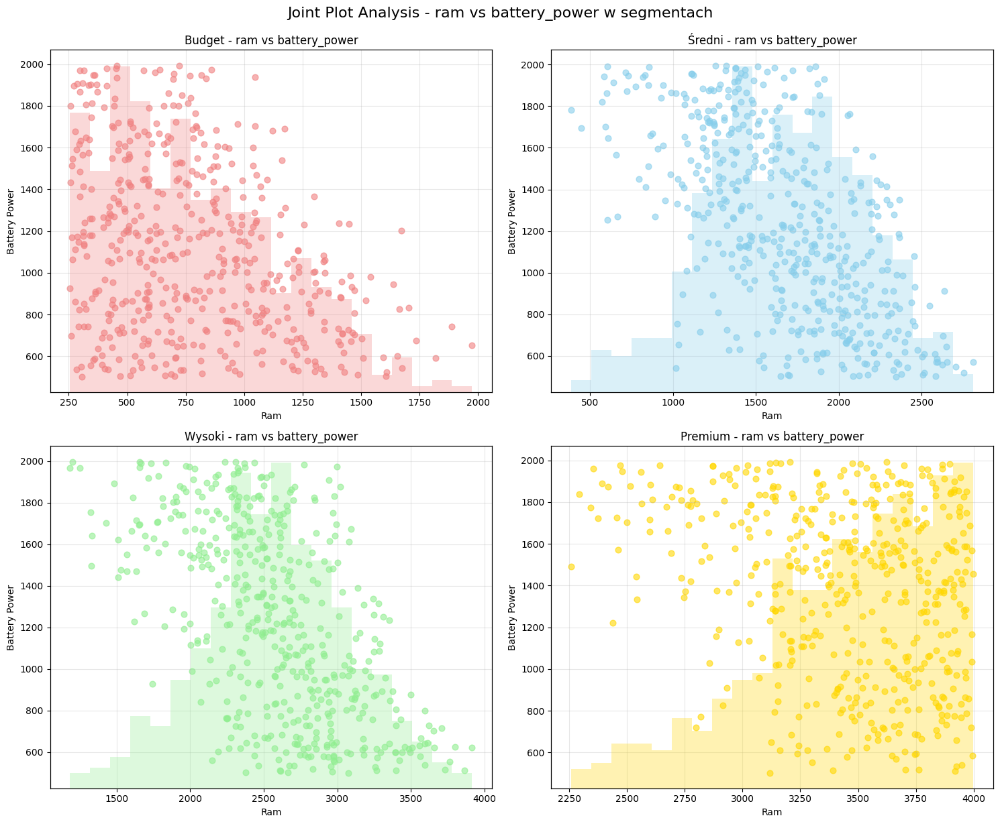

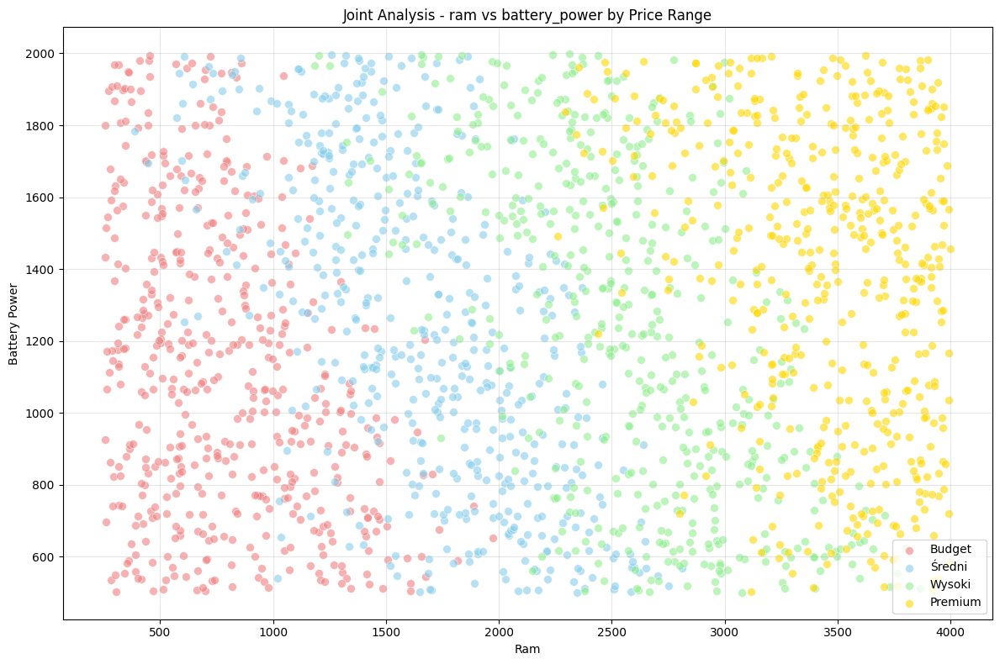

In [32]:
# Joint Plot - Analiza dwuwymiarowa z marginalnymi rozkładami
# Inspirowane: https://seaborn.pydata.org/examples/joint_kde.html
# Analiza relacji między dwoma najsilniejszymi predyktorami
# Joint Plot: 
# a) pokazuje relację 2D + marginalne rozkłady
# b) jak dwa kluczowe predyktory współpracują
# c) czy są "sweet spots" w kombinacjach cech?

# Wybierz dwa najsilniejsze predyktory
var1, var2 = top_predictors[0], top_predictors[1]

# Joint plot z różnymi kategoriami cenowymi
fig, axes = plt.subplots(2, 2, figsize=(15, 12))

for i, price_cat in enumerate(range(4)):
    row, col = i // 2, i % 2
    segment_data = df[df['price_range'] == price_cat]
    
    # Scatter plot w centrum
    axes[row, col].scatter(segment_data[var1], segment_data[var2], 
                          alpha=0.6, color=colors[price_cat], s=40)
    
    # Marginalne histogramy (symulacja joint plot)
    # Top margin - histogram var1
    ax_top = axes[row, col].twinx()
    ax_top.hist(segment_data[var1], bins=20, alpha=0.3, color=colors[price_cat], 
                orientation='vertical', density=True)
    ax_top.set_ylabel('')
    ax_top.set_yticks([])
    
    axes[row, col].set_xlabel(var1.replace('_', ' ').title())
    axes[row, col].set_ylabel(var2.replace('_', ' ').title())
    axes[row, col].set_title(f'{segments[price_cat]} - {var1} vs {var2}')
    axes[row, col].grid(True, alpha=0.3)

plt.tight_layout()
plt.suptitle(f'Joint Plot Analysis - {var1} vs {var2} w segmentach', fontsize=16, y=1.02)
plt.show()

# Alternatywnie - prawdziwy joint plot
plt.figure(figsize=(12, 8))
for price_cat in range(4):
    segment_data = df[df['price_range'] == price_cat]
    sns.scatterplot(data=segment_data, x=var1, y=var2, 
                   color=colors[price_cat], label=segments[price_cat], 
                   alpha=0.6, s=50)

plt.xlabel(var1.replace('_', ' ').title())
plt.ylabel(var2.replace('_', ' ').title())
plt.title(f'Joint Analysis - {var1} vs {var2} by Price Range')
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

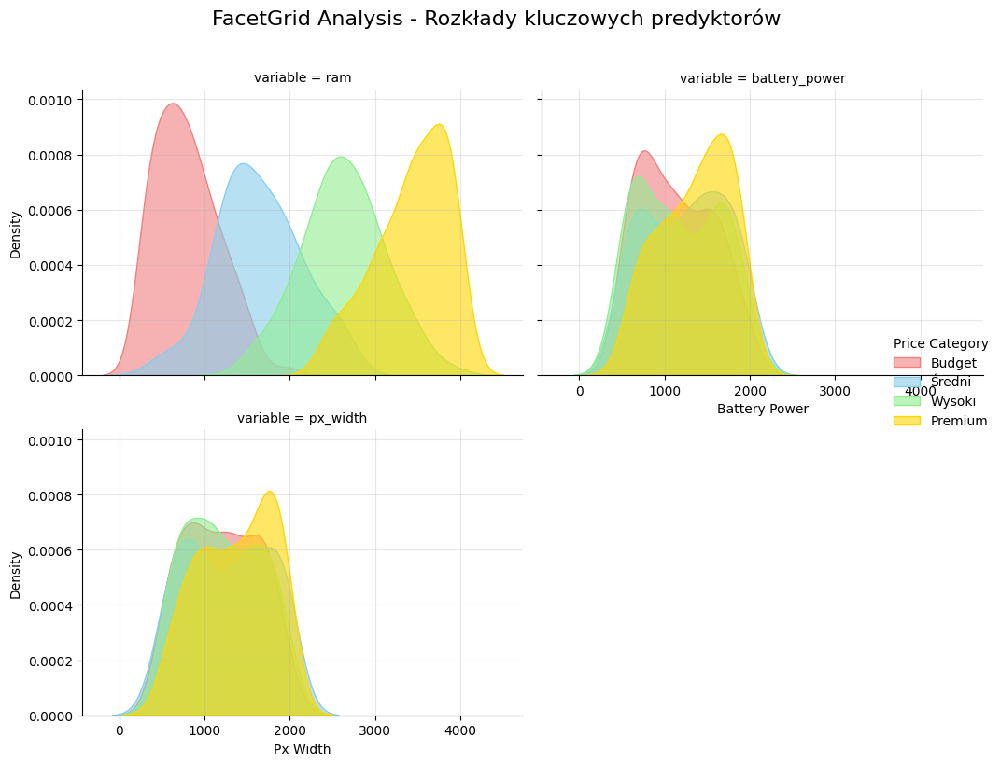

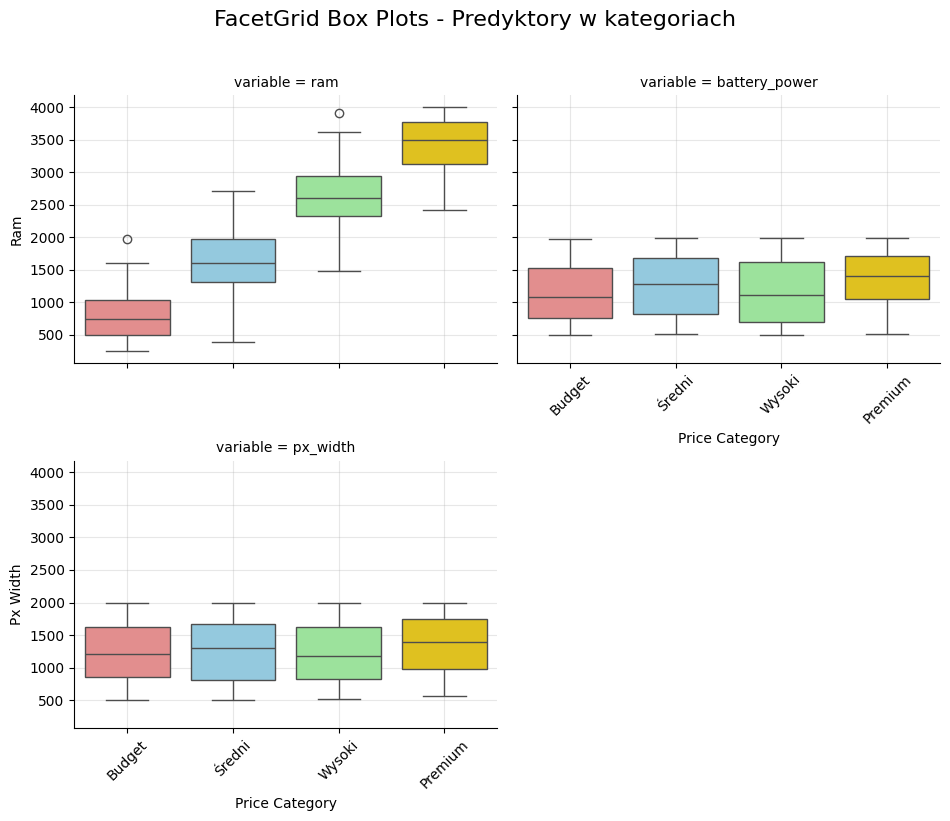

In [33]:
# FacetGrid - Multidimensional analysis
# Inspirowane: https://seaborn.pydata.org/examples/faceted_lineplot.html
# Analiza wielu zmiennych jednocześnie
# FacetGrid:
# a) wiele zmiennych w jednej eleganckiej wizualizacji
# b) porównanie wzorców między wszystkimi predyktorami
# c) które zmienne mają podobne/różne wzorce?

# Przygotuj dane w long format
predictors_to_analyze = top_predictors[:4]
long_data = []

for var in predictors_to_analyze:
    for price_cat in range(4):
        segment_data = df[df['price_range'] == price_cat]
        for value in segment_data[var].sample(min(100, len(segment_data))):  # Sample dla wydajności
            long_data.append({
                'variable': var,
                'value': value,
                'price_category': segments[price_cat],
                'price_range': price_cat
            })

long_df = pd.DataFrame(long_data)

# FacetGrid z KDE - POPRAWIONE
g = sns.FacetGrid(long_df, col='variable', hue='price_category', 
                  palette=['lightcoral', 'skyblue', 'lightgreen', 'gold'],
                  col_wrap=2, height=4, aspect=1.2)

g.map(sns.kdeplot, 'value', fill=True, alpha=0.6)
g.add_legend(title='Price Category')

for ax, var in zip(g.axes.flat, predictors_to_analyze):
    ax.set_xlabel(var.replace('_', ' ').title())
    ax.set_ylabel('Density')
    ax.grid(True, alpha=0.3)

plt.suptitle('FacetGrid Analysis - Rozkłady kluczowych predyktorów', fontsize=16, y=1.02)
plt.tight_layout()
plt.show()

# FacetGrid z box plots - POPRAWIONE
g2 = sns.FacetGrid(long_df, col='variable', col_wrap=2, height=4, aspect=1.2)

# Funkcja wrapper dla box plot z poprawną obsługą hue
def custom_boxplot(x, y, **kwargs):
    data = kwargs.pop('data', None)
    if data is not None:
        # Określ order dla kategorii
        order = ['Budget', 'Średni', 'Wysoki', 'Premium']
        sns.boxplot(data=data, x=x, y=y, hue=x, 
                   palette=['lightcoral', 'skyblue', 'lightgreen', 'gold'],
                   order=order, legend=False)
    else:
        sns.boxplot(x=x, y=y, **kwargs)

g2.map_dataframe(custom_boxplot, 'price_category', 'value')

for ax, var in zip(g2.axes.flat, predictors_to_analyze):
    ax.set_xlabel('Price Category')
    ax.set_ylabel(var.replace('_', ' ').title())
    ax.tick_params(axis='x', rotation=45)
    ax.grid(True, alpha=0.3)

plt.suptitle('FacetGrid Box Plots - Predyktory w kategoriach', fontsize=16, y=1.02)
plt.tight_layout()
plt.show()

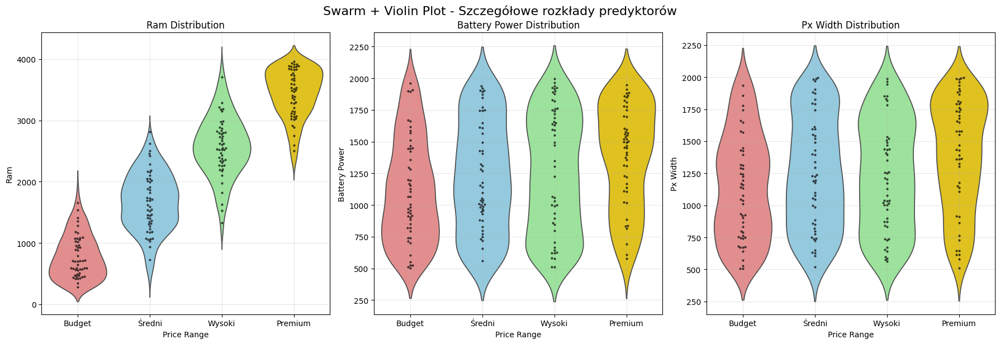

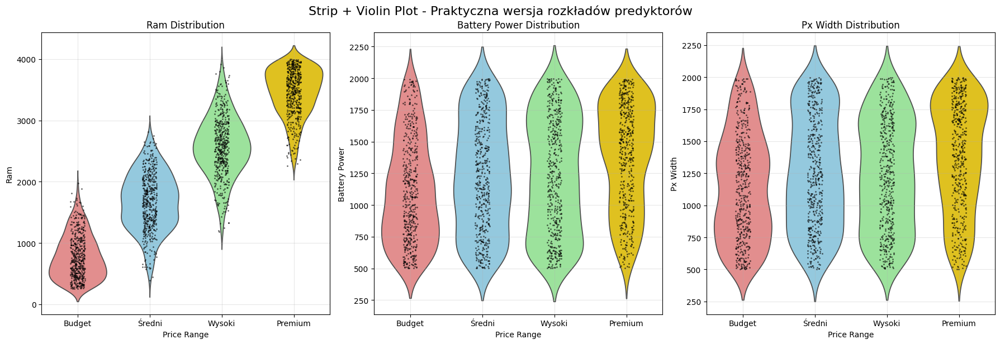

In [34]:
# Inspirowane: https://seaborn.pydata.org/examples/grouped_violinplots.html
# Kombinacja swarm plot z violin plot
# Swarm/Violin Plot:
# a) każdy punkt + kształt rozkładu jednocześnie
# b) najszczegółowszy obraz outlierów i rozkładów
# c) gdzie dokładnie są telefony w każdym segmencie?

# Sarm Plot
# Wybierz 3 najważniejsze predyktory
top_3_vars = top_predictors[:3]
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

for i, var in enumerate(top_3_vars):
    # Violin plot jako tło
    sns.violinplot(data=df, x='price_range', y=var, ax=axes[i],
                   hue='price_range',
                   palette=['lightcoral', 'skyblue', 'lightgreen', 'gold'],
                   inner=None, legend=False)
    
    # Swarm plot na górze - UPROSZCZONE (bez problematycznego groupby)
    # Wybierz próbkę z każdego segmentu
    sample_list = []
    for price_cat in range(4):
        segment_data = df[df['price_range'] == price_cat]
        if len(segment_data) > 50:
            sample_segment = segment_data.sample(50)
        else:
            sample_segment = segment_data
        sample_list.append(sample_segment)
    
    # Połącz wszystkie próbki
    sample_df = pd.concat(sample_list, ignore_index=True)
    
    sns.swarmplot(data=sample_df, x='price_range', y=var, ax=axes[i],
                  color='black', alpha=0.7, size=3)
    
    axes[i].set_xlabel('Price Range')
    axes[i].set_ylabel(var.replace('_', ' ').title())
    axes[i].set_title(f'{var.replace("_", " ").title()} Distribution')
    
    # Poprawione ustawienie etykiet
    axes[i].set_xticks([0, 1, 2, 3])
    axes[i].set_xticklabels(['Budget', 'Średni', 'Wysoki', 'Premium'])
    axes[i].grid(True, alpha=0.3)

plt.tight_layout()
plt.suptitle('Swarm + Violin Plot - Szczegółowe rozkłady predyktorów', fontsize=16, y=1.02)
plt.show()

# Strip Plot
# Wybierz 3 najważniejsze predyktory
top_3_vars = top_predictors[:3]
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

for i, var in enumerate(top_3_vars):
    # Violin plot jako tło
    sns.violinplot(data=df, x='price_range', y=var, ax=axes[i],
                   hue='price_range',
                   palette=['lightcoral', 'skyblue', 'lightgreen', 'gold'],
                   inner=None, legend=False)
    
    # Strip plot zamiast swarm - UPROSZCZONE i szybkie
    sns.stripplot(data=df, x='price_range', y=var, ax=axes[i],
                  color='black', alpha=0.6, size=2, jitter=True)
    
    axes[i].set_xlabel('Price Range')
    axes[i].set_ylabel(var.replace('_', ' ').title())
    axes[i].set_title(f'{var.replace("_", " ").title()} Distribution')
    
    # Poprawione ustawienie etykiet
    axes[i].set_xticks([0, 1, 2, 3])
    axes[i].set_xticklabels(['Budget', 'Średni', 'Wysoki', 'Premium'])
    axes[i].grid(True, alpha=0.3)

plt.tight_layout()
plt.suptitle('Strip + Violin Plot - Praktyczna wersja rozkładów predyktorów', fontsize=16, y=1.02)
plt.show()


# 📱 ANALIZA RYNKU TELEFONÓW KOMÓRKOWYCH
## Raport strategiczny

**Cel:** Zrozumieć strategię cenową konkurencji (Apple, Samsung, etc.)  
**Pytanie:** Jakie cechy telefonu wpływają na jego cenę?  
**Data analizy:** 2025-10-21

---


## 📊 1. PODSTAWOWE INFORMACJE O ZBIORZE


### Wielkość zbioru:
- **2000** telefonów w analizie
- **20** cech technicznych każdego telefonu
- **4** segmenty cenowe (Budget → Premium)


### Rozkład telefonów w segmentach cenowych:

- **Budget**: 500 telefonów (25.0%)

- **Średni**: 500 telefonów (25.0%)

- **Wysoki**: 500 telefonów (25.0%)

- **Premium**: 500 telefonów (25.0%)


### 💡 Wniosek:
Rynek jest **zrównoważony** - wszystkie segmenty mają podobną wielkość.


## 📈 2. STATYSTYKI OPISOWE ZMIENNYCH


### Typy zmiennych:
- **14** zmiennych numerycznych (RAM, bateria, etc.)
- **6** zmiennych binarnych (Bluetooth, WiFi, etc.)


### Statystyki zmiennych numerycznych:

,battery_power,clock_speed,fc,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time
count,2000.00,2000.00,2000.00,2000.00,2000.00,2000.00,2000.00,2000.00,2000.00,2000.00,2000.00,2000.00,2000.00,2000.00
mean,1238.52,1.52,4.31,32.05,0.50,140.25,4.52,9.92,645.11,1251.52,2124.21,12.31,5.77,11.01
std,439.42,0.82,4.34,18.15,0.29,35.40,2.29,6.06,443.78,432.20,1084.73,4.21,4.36,5.46
min,501.00,0.50,0.00,2.00,0.10,80.00,1.00,0.00,0.00,500.00,256.00,5.00,0.00,2.00
25%,851.75,0.70,1.00,16.00,0.20,109.00,3.00,5.00,282.75,874.75,1207.50,9.00,2.00,6.00
50%,1226.00,1.50,3.00,32.00,0.50,141.00,4.00,10.00,564.00,1247.00,2146.50,12.00,5.00,11.00
75%,1615.25,2.20,7.00,48.00,0.80,170.00,7.00,15.00,947.25,1633.00,3064.50,16.00,9.00,16.00
max,1998.00,3.00,19.00,64.00,1.00,200.00,8.00,20.00,1960.00,1998.00,3998.00,19.00,18.00,20.00


### Częstość cech binarnych:

- **blue**: 49.5% telefonów ma tę cechę

- **dual_sim**: 50.9% telefonów ma tę cechę

- **four_g**: 52.1% telefonów ma tę cechę

- **three_g**: 76.1% telefonów ma tę cechę

- **touch_screen**: 50.3% telefonów ma tę cechę

- **wifi**: 50.7% telefonów ma tę cechę

## 🔗 3. ANALIZA KORELACJI Z CENĄ

### Top 5 predyktorów ceny:

1. **ram**: 0.917 (związek bardzo silny)

2. **battery_power**: 0.201 (związek słaby)

3. **px_width**: 0.166 (związek słaby)

4. **px_height**: 0.149 (związek słaby)

5. **int_memory**: 0.044 (związek słaby)


### 💡 Kluczowy wniosek:
**ram** to najważniejszy czynnik wpływający na cenę telefonu!


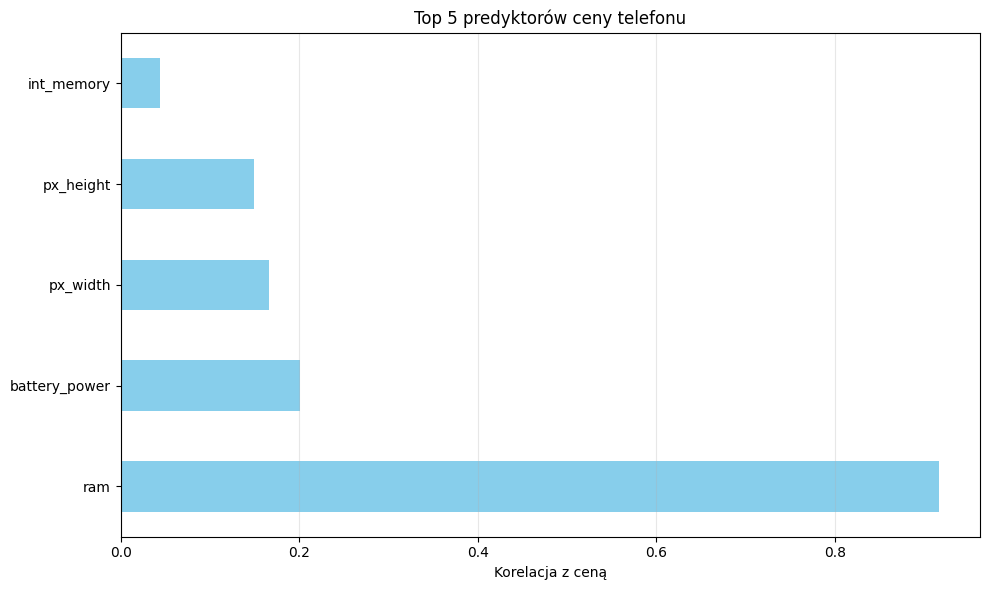

## 📊 4. ANALIZA ROZKŁADÓW

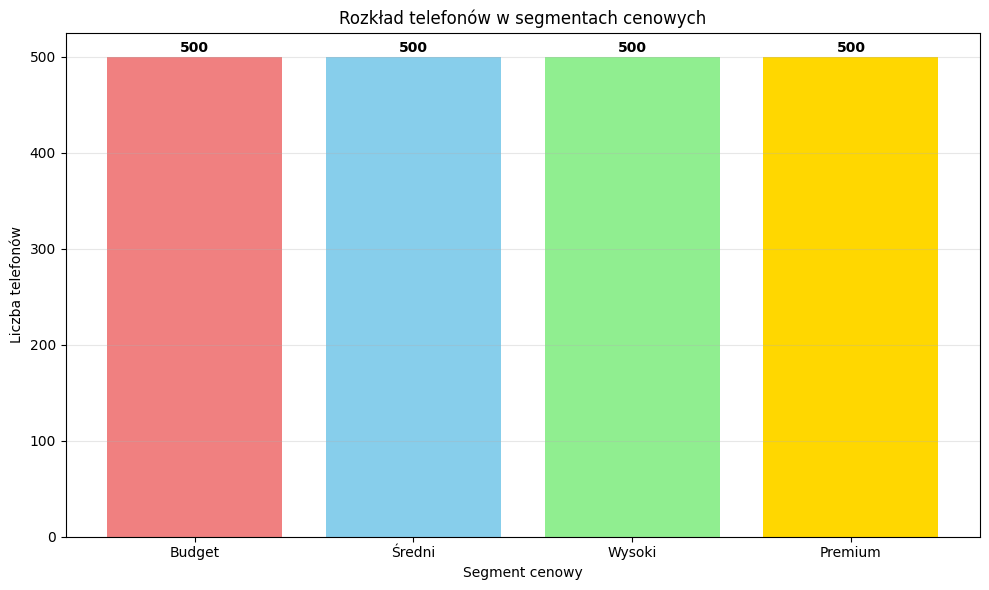

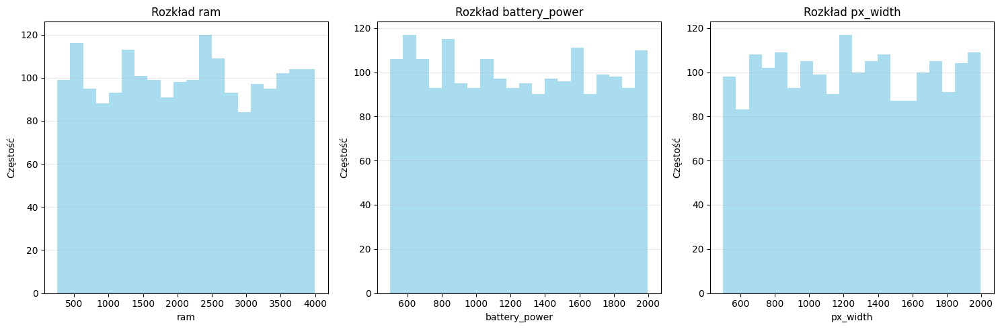

## 🎯 5. ANALIZA PREDYKTORÓW

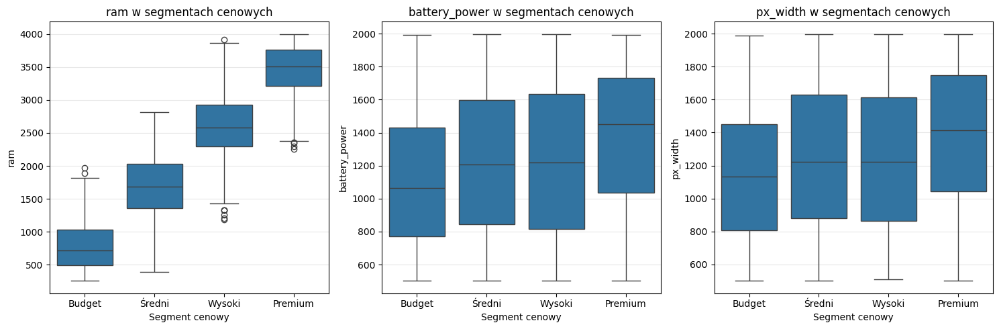

### 💡 Wnioski z analizy predyktorów:

- **ram**: Premium telefony mają +339% więcej niż Budget

- **battery_power**: Premium telefony mają +24% więcej niż Budget

- **px_width**: Premium telefony mają +19% więcej niż Budget

## 🔍 6. PORÓWNANIE SEGMENTÓW CENOWYCH

### Średnie wartości w segmentach:

,battery_power,px_width,ram
Budget,1116.9,1150.3,785.3
Średni,1228.9,1251.9,1679.5
Wysoki,1228.3,1234.0,2582.8
Premium,1380.0,1369.8,3449.2


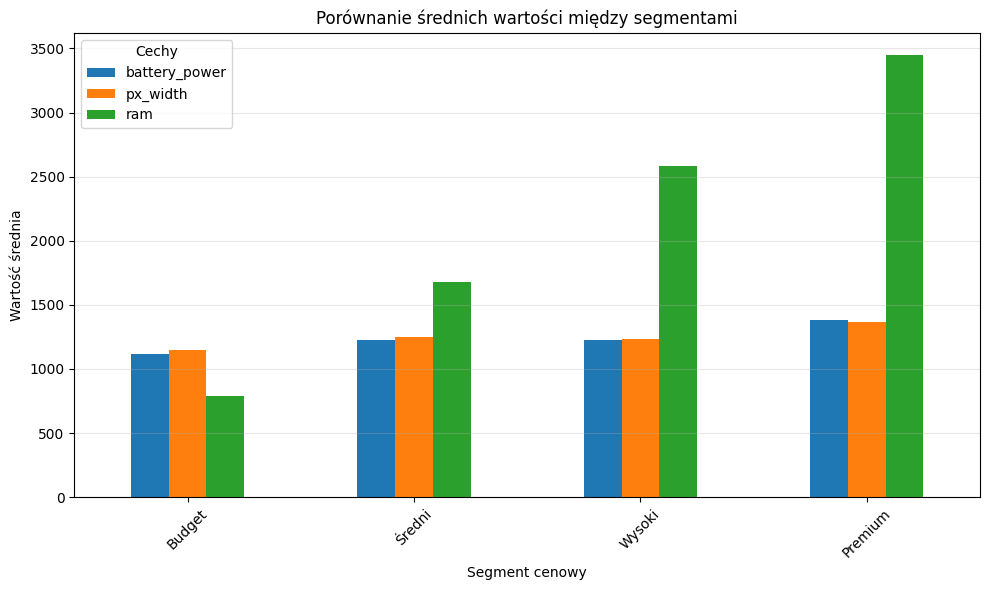

## 🎨 7. ZAAWANSOWANE INSIGHTS

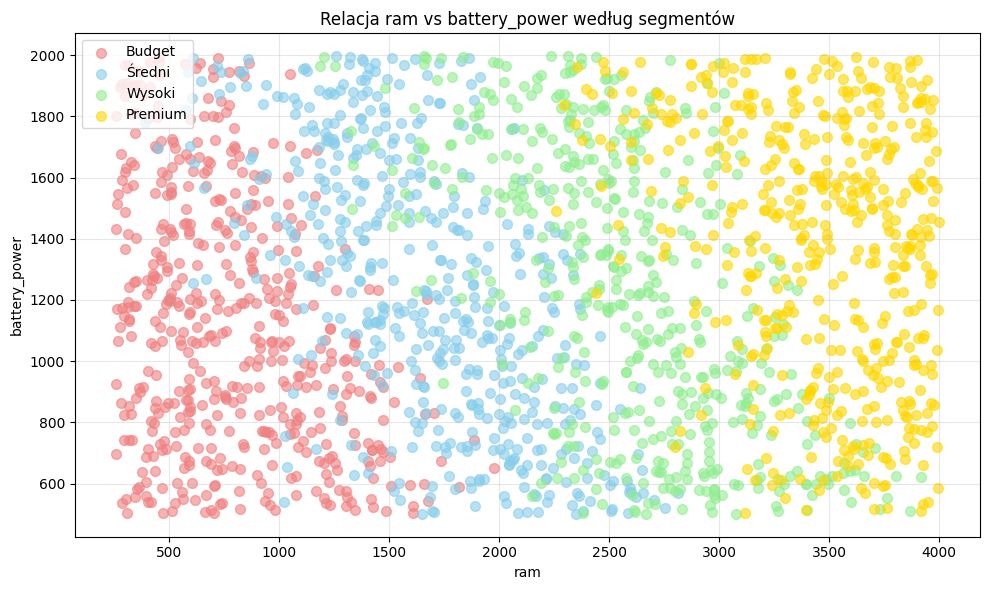

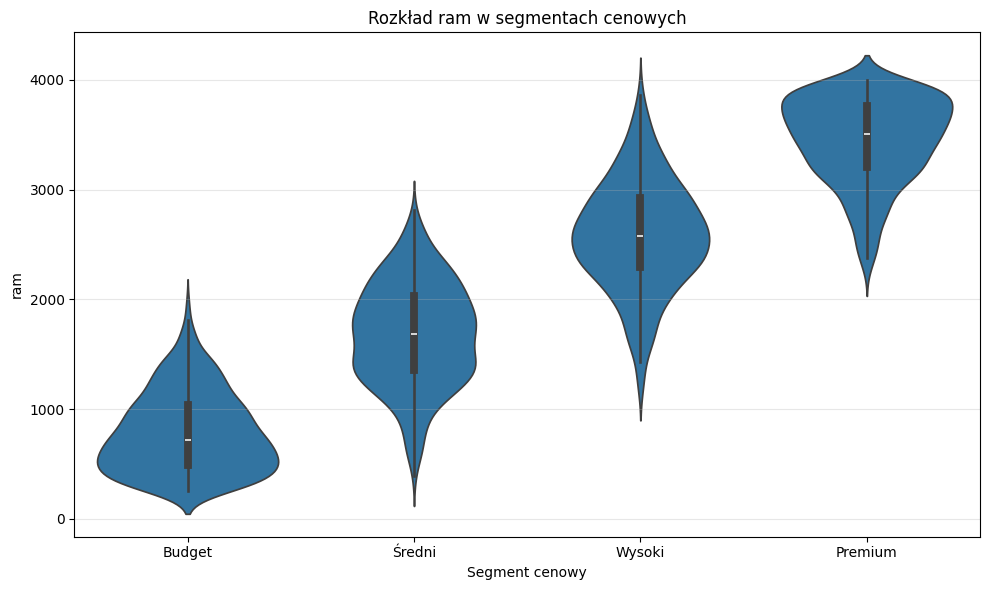

## 🎯 8. REKOMENDACJE BIZNESOWE


### 🎯 Strategia cenowa:

#### 1. Priorytet #1: ram
- **Budget telefony**: średnio 785
- **Premium telefony**: średnio 3449
- **Rekomendacja**: To główny lever cenowy! Dostosuj ram do docelowego segmentu.

#### 2. Priorytet #2: battery_power
- **Rekomendacja**: Użyj jako drugorzędny czynnik różnicujący.

#### 3. Pozycjonowanie produktu:
- **Dla konkurencji z Apple/Samsung**: Skupić się na top predyktorach
- **Luki rynkowe**: Szukać kombinacji cech niedostatecznie reprezentowanych
- **Optymalizacja kosztów**: Cechy o słabej korelacji z ceną to potencjalne oszczędności

#### 4. Konkretne działania:
1. **Benchmarking**: Porównaj swoje telefony z konkurencją w kontekście ram
2. **Segmentacja**: Zdecyduj który segment atakować jako pierwszy
3. **Optymalizacja**: Dostosuj ram do wybranego segmentu
4. **Monitorowanie**: Śledź jak zmiany w kluczowych cechach wpływają na pozycję cenową


In [35]:
# Zautomatyzowany raport w Jupyter
# === AUTOMATYCZNY RAPORT EDA ===
class MobilePhoneMarketReport:
    def __init__(self, df):
        self.df = df
        self.segments = ['Budget', 'Średni', 'Wysoki', 'Premium']
        self.target = 'price_range'
        
    def generate_report(self):
        """Generuje kompletny raport"""
        self._business_header()
        self._basic_overview()
        self._descriptive_stats()
        self._correlation_analysis()
        self._distribution_analysis()
        self._predictors_analysis()
        self._segment_comparison()
        self._advanced_insights()
        self._business_recommendations()
    
    def _business_header(self):
        display(Markdown(f"""
# 📱 ANALIZA RYNKU TELEFONÓW KOMÓRKOWYCH
## Raport strategiczny

**Cel:** Zrozumieć strategię cenową konkurencji (Apple, Samsung, etc.)  
**Pytanie:** Jakie cechy telefonu wpływają na jego cenę?  
**Data analizy:** {pd.Timestamp.now().strftime('%Y-%m-%d')}

---
"""))
    
    def _basic_overview(self):
        display(Markdown("## 📊 1. PODSTAWOWE INFORMACJE O ZBIORZE"))
        
        # Podstawowe statystyki
        n_phones = len(self.df)
        n_features = len(self.df.columns) - 1  # Bez price_range
        
        display(Markdown(f"""
### Wielkość zbioru:
- **{n_phones}** telefonów w analizie
- **{n_features}** cech technicznych każdego telefonu
- **4** segmenty cenowe (Budget → Premium)
"""))
        
        # Rozkład segmentów
        segment_counts = self.df[self.target].value_counts().sort_index()
        
        display(Markdown("### Rozkład telefonów w segmentach cenowych:"))
        for i, count in enumerate(segment_counts):
            pct = count / n_phones * 100
            display(Markdown(f"- **{self.segments[i]}**: {count} telefonów ({pct:.1f}%)"))
        
        # Wniosek o balansie
        balance_ratio = segment_counts.max() / segment_counts.min()
        balance_status = "zrównoważony" if balance_ratio < 1.2 else "niezrównoważony"
        
        display(Markdown(f"""
### 💡 Wniosek:
Rynek jest **{balance_status}** - {'wszystkie segmenty mają podobną wielkość' if balance_ratio < 1.2 else 'niektóre segmenty są większe od innych'}.
"""))
    
    def _descriptive_stats(self):
        display(Markdown("## 📈 2. STATYSTYKI OPISOWE ZMIENNYCH"))
        
        # Automatycznie podziel zmienne
        numeric_vars = []
        binary_vars = []
        
        for col in self.df.columns:
            if col != self.target:
                if set(self.df[col].unique()).issubset({0, 1}):
                    binary_vars.append(col)
                else:
                    numeric_vars.append(col)
        
        display(Markdown(f"""
### Typy zmiennych:
- **{len(numeric_vars)}** zmiennych numerycznych (RAM, bateria, etc.)
- **{len(binary_vars)}** zmiennych binarnych (Bluetooth, WiFi, etc.)
"""))
        
        # Statystyki numeryczne
        if numeric_vars:
            display(Markdown("### Statystyki zmiennych numerycznych:"))
            stats = self.df[numeric_vars].describe()
            display(stats.round(2))
        
        # Statystyki binarne
        if binary_vars:
            display(Markdown("### Częstość cech binarnych:"))
            binary_stats = self.df[binary_vars].mean() * 100
            for var, pct in binary_stats.items():
                display(Markdown(f"- **{var}**: {pct:.1f}% telefonów ma tę cechę"))
    
    def _correlation_analysis(self):
        display(Markdown("## 🔗 3. ANALIZA KORELACJI Z CENĄ"))
        
        # Znajdź najsilniejsze korelacje
        correlations = self.df.corr()[self.target].abs().sort_values(ascending=False)
        top_correlations = correlations.drop(self.target).head(5)
        
        display(Markdown("### Top 5 predyktorów ceny:"))
        for i, (var, corr) in enumerate(top_correlations.items(), 1):
            strength = self._interpret_correlation(corr)
            display(Markdown(f"{i}. **{var}**: {corr:.3f} (związek {strength})"))
        
        # Automatyczne wnioski
        strongest_predictor = top_correlations.index[0]
        display(Markdown(f"""
### 💡 Kluczowy wniosek:
**{strongest_predictor}** to najważniejszy czynnik wpływający na cenę telefonu!
"""))
        
        # Wizualizacja korelacji
        plt.figure(figsize=(10, 6))
        top_correlations.plot(kind='barh', color='skyblue')
        plt.title('Top 5 predyktorów ceny telefonu')
        plt.xlabel('Korelacja z ceną')
        plt.grid(axis='x', alpha=0.3)
        plt.tight_layout()
        plt.show()
    
    def _distribution_analysis(self):
        display(Markdown("## 📊 4. ANALIZA ROZKŁADÓW"))
        
        # Rozkład zmiennej objaśnianej
        plt.figure(figsize=(10, 6))
        counts = self.df[self.target].value_counts().sort_index()
        
        plt.bar(range(4), counts, color=['lightcoral', 'skyblue', 'lightgreen', 'gold'])
        plt.title('Rozkład telefonów w segmentach cenowych')
        plt.xlabel('Segment cenowy')
        plt.ylabel('Liczba telefonów')
        plt.xticks(range(4), self.segments)
        
        # Dodaj wartości na słupkach
        for i, count in enumerate(counts):
            plt.text(i, count + 5, str(count), ha='center', fontweight='bold')
        
        plt.grid(axis='y', alpha=0.3)
        plt.tight_layout()
        plt.show()
        
        # Rozkłady top predyktorów
        top_vars = self.df.corr()[self.target].abs().sort_values(ascending=False).drop(self.target).head(3).index
        
        fig, axes = plt.subplots(1, 3, figsize=(15, 5))
        for i, var in enumerate(top_vars):
            axes[i].hist(self.df[var], bins=20, alpha=0.7, color='skyblue')
            axes[i].set_title(f'Rozkład {var}')
            axes[i].set_xlabel(var)
            axes[i].set_ylabel('Częstość')
            axes[i].grid(axis='y', alpha=0.3)
        
        plt.tight_layout()
        plt.show()
    
    def _predictors_analysis(self):
        display(Markdown("## 🎯 5. ANALIZA PREDYKTORÓW"))
        
        # Top 3 predyktory
        top_vars = self.df.corr()[self.target].abs().sort_values(ascending=False).drop(self.target).head(3).index
        
        # Box plots
        fig, axes = plt.subplots(1, 3, figsize=(15, 5))
        for i, var in enumerate(top_vars):
            sns.boxplot(data=self.df, x=self.target, y=var, ax=axes[i])
            axes[i].set_title(f'{var} w segmentach cenowych')
            axes[i].set_xlabel('Segment cenowy')
            axes[i].set_xticks([0, 1, 2, 3])
            axes[i].set_xticklabels(self.segments)
            axes[i].grid(axis='y', alpha=0.3)
        
        plt.tight_layout()
        plt.show()
        
        # Wnioski
        display(Markdown("### 💡 Wnioski z analizy predyktorów:"))
        for var in top_vars:
            low_val = self.df[self.df[self.target] == 0][var].mean()
            high_val = self.df[self.df[self.target] == 3][var].mean()
            change = ((high_val - low_val) / low_val) * 100
            
            display(Markdown(f"- **{var}**: Premium telefony mają {change:+.0f}% więcej niż Budget"))
    
    def _segment_comparison(self):
        display(Markdown("## 🔍 6. PORÓWNANIE SEGMENTÓW CENOWYCH"))
        
        # Tabela przestawna dla top predyktorów
        top_vars = self.df.corr()[self.target].abs().sort_values(ascending=False).drop(self.target).head(3).index
        
        pivot_table = pd.pivot_table(self.df, values=list(top_vars), index=self.target, aggfunc='mean')
        pivot_table.index = self.segments
        
        display(Markdown("### Średnie wartości w segmentach:"))
        display(pivot_table.round(1))
        
        # Wizualizacja
        pivot_table.plot(kind='bar', figsize=(10, 6), rot=45)
        plt.title('Porównanie średnich wartości między segmentami')
        plt.xlabel('Segment cenowy')
        plt.ylabel('Wartość średnia')
        plt.legend(title='Cechy')
        plt.grid(axis='y', alpha=0.3)
        plt.tight_layout()
        plt.show()
    
    def _advanced_insights(self):
        display(Markdown("## 🎨 7. ZAAWANSOWANE INSIGHTS"))
        
        # Scatter plot najsilniejszych predyktorów
        top_vars = self.df.corr()[self.target].abs().sort_values(ascending=False).drop(self.target).head(2).index
        
        plt.figure(figsize=(10, 6))
        colors = ['lightcoral', 'skyblue', 'lightgreen', 'gold']
        for i in range(4):
            segment_data = self.df[self.df[self.target] == i]
            plt.scatter(segment_data[top_vars[0]], segment_data[top_vars[1]], 
                       alpha=0.6, label=self.segments[i], s=50, color=colors[i])
        
        plt.xlabel(top_vars[0])
        plt.ylabel(top_vars[1])
        plt.title(f'Relacja {top_vars[0]} vs {top_vars[1]} według segmentów')
        plt.legend()
        plt.grid(alpha=0.3)
        plt.tight_layout()
        plt.show()
        
        # Violin plot
        strongest_var = self.df.corr()[self.target].abs().sort_values(ascending=False).drop(self.target).index[0]
        
        plt.figure(figsize=(10, 6))
        sns.violinplot(data=self.df, x=self.target, y=strongest_var)
        plt.title(f'Rozkład {strongest_var} w segmentach cenowych')
        plt.xlabel('Segment cenowy')
        plt.xticks([0, 1, 2, 3], self.segments)
        plt.grid(axis='y', alpha=0.3)
        plt.tight_layout()
        plt.show()
    
    def _business_recommendations(self):
        display(Markdown("## 🎯 8. REKOMENDACJE BIZNESOWE"))
        
        # Znajdź top predyktory
        top_predictor = self.df.corr()[self.target].abs().sort_values(ascending=False).drop(self.target).index[0]
        second_predictor = self.df.corr()[self.target].abs().sort_values(ascending=False).drop(self.target).index[1]
        
        # Oblicz średnie dla segmentów
        budget_val = self.df[self.df[self.target] == 0][top_predictor].mean()
        premium_val = self.df[self.df[self.target] == 3][top_predictor].mean()
        
        display(Markdown(f"""
### 🎯 Strategia cenowa:

#### 1. Priorytet #1: {top_predictor}
- **Budget telefony**: średnio {budget_val:.0f}
- **Premium telefony**: średnio {premium_val:.0f}
- **Rekomendacja**: To główny lever cenowy! Dostosuj {top_predictor} do docelowego segmentu.

#### 2. Priorytet #2: {second_predictor}
- **Rekomendacja**: Użyj jako drugorzędny czynnik różnicujący.

#### 3. Pozycjonowanie produktu:
- **Dla konkurencji z Apple/Samsung**: Skupić się na top predyktorach
- **Luki rynkowe**: Szukać kombinacji cech niedostatecznie reprezentowanych
- **Optymalizacja kosztów**: Cechy o słabej korelacji z ceną to potencjalne oszczędności

#### 4. Konkretne działania:
1. **Benchmarking**: Porównaj swoje telefony z konkurencją w kontekście {top_predictor}
2. **Segmentacja**: Zdecyduj który segment atakować jako pierwszy
3. **Optymalizacja**: Dostosuj {top_predictor} do wybranego segmentu
4. **Monitorowanie**: Śledź jak zmiany w kluczowych cechach wpływają na pozycję cenową
"""))
    
    def _interpret_correlation(self, corr):
        """Interpretuje siłę korelacji"""
        if corr >= 0.7:
            return "bardzo silny"
        elif corr >= 0.5:
            return "silny"
        elif corr >= 0.3:
            return "umiarkowany"
        else:
            return "słaby"

# === UŻYCIE - POPRAWIONE ===
# Stwórz i uruchom raport
report = MobilePhoneMarketReport(df)
report.generate_report()